# Lizard Species Image Classification Challenge

**Course:** Artificial Intelligence - Thomas More  
**Team members:** `Kyan Collier, Amélie Hermans en Tom Sterckx`  
**Notebook goal:** build a strong, well-documented TensorFlow/Keras image classifier for 7 lizard species.

## Species
1. Black spiny tailed iguana
2. Brown anole
3. Cuban knight anole
4. Desert iguana
5. Green anole
6. Green iguana
7. Lesser Antillean iguana

## What this notebook covers
- dataset integrity checks and exploratory data analysis
- image quality checks, including duplicate analysis and OCR-style text-overlay checks
- data augmentation
- staged transfer learning with a stronger fine-tuning schedule
- training and validation visualisation
- confusion matrix and macro-F1 evaluation
- Hyperband pruning as an extra tuning attempt
- embedding-assisted inference with kNN blending
- test-set inference and competition submission export
- a short GenAI reflection section

In [4]:
# Run this once if your environment is still missing packages.
# In Google Colab, use this cell before running the rest of the notebook.
%pip install -q tensorflow pandas numpy matplotlib pillow opencv-python pytesseract openpyxl optuna tensorboard wandb

# Important:
# `pytesseract` is only the Python wrapper.
# For real OCR extraction you still need the Tesseract engine installed on the machine itself.

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 26.0.1 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Why this approach?

The dataset is relatively small, so a pure CNN from scratch would likely underperform or overfit quickly.  
Because of that, we combine:

- transfer learning from an ImageNet backbone
- moderate augmentation
- early stopping and learning-rate reduction
- a duplicate-aware validation split to reduce leakage risk
- horizontal-flip test-time augmentation plus embedding-assisted inference selection

The challenge page mentions "probabilities", but the provided sample submission and the macro-F1 scoring setup point to a **single class label per image**.  
We therefore export the same columns as `sample_submission.csv`, with integer class predictions in the target column.

## 0A. Imports and Global Settings

All important hyperparameters are collected near the top so the notebook is easy to adjust and defend.  
We fix the random seed for repeatability, use `260x260` images as a balance between detail and speed, and keep the final training settings visible.

In [5]:
from pathlib import Path
import json
import math
import os
import shutil
import warnings
from datetime import datetime

# Keep TensorFlow's low-level runtime info logs out of the notebook output.
os.environ.setdefault("TF_CPP_MIN_LOG_LEVEL", "2")

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from IPython.display import display
from PIL import Image, ImageOps
from tensorflow import keras
from tensorflow.keras import layers

try:
    import optuna
except ImportError:
    optuna = None

try:
    import wandb
    WANDB_AVAILABLE = True
except ImportError:
    WANDB_AVAILABLE = False

try:
    from tensorflow.keras.callbacks import TensorBoard
except ImportError:
    TensorBoard = None

try:
    get_ipython().run_line_magic("matplotlib", "inline")
except Exception:
    plt.switch_backend("Agg")

warnings.filterwarnings("ignore")
plt.style.use("seaborn-v0_8")

SEED = 12
IMG_SIZE = (260, 260)
BATCH_SIZE = 24
VAL_FRACTION = 0.20
INITIAL_EPOCHS = 8
FINE_TUNE_EPOCHS = 12
FINE_TUNE_LAYERS = 30
HEAD_LEARNING_RATE = 2e-4
FINE_TUNE_LEARNING_RATE = 1e-5
USE_CLASS_WEIGHTS = True
TRAINING_AUGMENTATION_STRENGTH = 1.0
DROPOUT_RATE = 0.35
DEFAULT_MODEL_PARAMS = {
    "learning_rate": 1e-4,
    "dropout_rate": 0.55,
    "dense_units": 64,
    "augmentation_strength": 0.6,
    "weight_decay": 1e-4,
}
INFERENCE_SEARCH_MODE = "auto"

# Advanced training features
USE_TENSORBOARD = True
USE_WANDB = False  # Set to True to enable WandB tracking
LR_SCHEDULE_TYPE = "cosine_annealing"  # Options: "exponential_decay", "cosine_annealing", "polynomial_decay"

keras.utils.set_random_seed(SEED)
AUTOTUNE = tf.data.AUTOTUNE

## 0C. Advanced Training Features: Learning Rate Schedules & TensorBoard

**Learning Rate Schedules** help the model converge better:
- **Exponential Decay**: learning rate decreases exponentially over time
- **Cosine Annealing**: smoothly decays learning rate following a cosine curve (good for fine-tuning)
- **Polynomial Decay**: flexible polynomial decay schedule

**TensorBoard** provides real-time visualization of:
- Loss and accuracy curves
- Learning rate changes
- Gradient distributions
- Custom metrics

**WandB** (optional) offers cloud-based experiment tracking with comparison tools.

Learning rate schedule type: cosine_annealing
Preview steps per epoch: 10


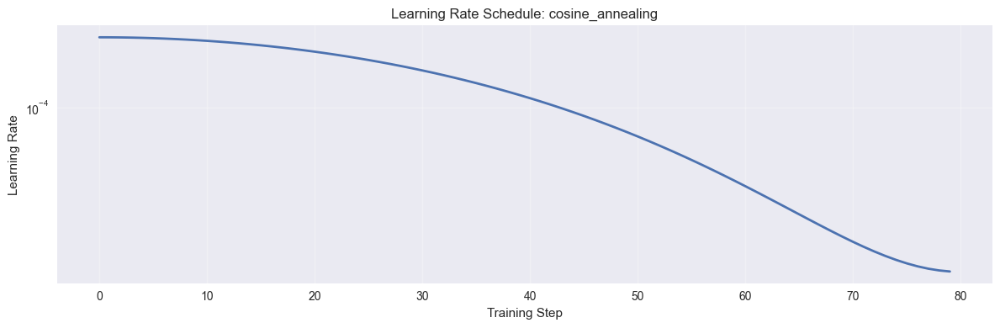

In [6]:
def create_learning_rate_schedule(
    initial_lr: float,
    total_epochs: int,
    steps_per_epoch: int,
    schedule_type: str = "exponential_decay",
) -> object:
    """
    Create a learning rate schedule callback or learning rate function.
    
    Args:
        initial_lr: Starting learning rate
        total_epochs: Total number of epochs for training
        steps_per_epoch: Number of steps (batches) per epoch
        schedule_type: Type of schedule ("exponential_decay", "cosine_annealing", "polynomial_decay")
    
    Returns:
        TensorFlow learning rate schedule object
    """
    total_steps = total_epochs * steps_per_epoch
    
    if schedule_type == "exponential_decay":
        # Exponential decay: lr(step) = initial_lr * decay_rate^(step / decay_steps)
        decay_steps = total_steps // 3  # Decay reaches ~5% of initial after 3 steps
        decay_rate = 0.1
        return tf.keras.optimizers.schedules.ExponentialDecay(
            initial_learning_rate=initial_lr,
            decay_steps=decay_steps,
            decay_rate=decay_rate,
            staircase=False,
        )
    
    elif schedule_type == "cosine_annealing":
        # Cosine annealing: smoothly decreases lr using cosine function
        return tf.keras.optimizers.schedules.CosineDecay(
            initial_learning_rate=initial_lr,
            decay_steps=total_steps,
            alpha=0.1,  # Minimum learning rate as fraction of initial
        )
    
    elif schedule_type == "polynomial_decay":
        # Polynomial decay: smooth polynomial decay with optional warm restarts
        return tf.keras.optimizers.schedules.PolynomialDecay(
            initial_learning_rate=initial_lr,
            decay_steps=total_steps,
            end_learning_rate=1e-6,
            power=1.0,  # 1.0 = linear, 2.0 = quadratic
        )
    
    else:
        raise ValueError(f"Unknown schedule type: {schedule_type}")

# Create the data for learning rate visualization
def plot_learning_rate_schedule(
    initial_lr: float,
    total_epochs: int,
    steps_per_epoch: int,
    schedule_type: str = "exponential_decay",
) -> None:
    """Visualize the learning rate schedule."""
    schedule = create_learning_rate_schedule(initial_lr, total_epochs, steps_per_epoch, schedule_type)
    
    total_steps = total_epochs * steps_per_epoch
    lrs = [schedule(step).numpy() for step in range(0, total_steps, max(1, total_steps // 200))]
    
    plt.figure(figsize=(12, 4))
    plt.plot(lrs, linewidth=2)
    plt.xlabel("Training Step")
    plt.ylabel("Learning Rate")
    plt.title(f"Learning Rate Schedule: {schedule_type}")
    plt.yscale("log")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Preview the selected schedule.
# At this point in the notebook the train/validation split does not exist yet,
# so we use a safe estimate. The real training cell recalculates this value
# with the actual train_split length.
preview_steps_per_epoch = max(1, math.ceil(len(train_df) * (1 - VAL_FRACTION) / BATCH_SIZE)) if "train_df" in globals() else 10
print(f"Learning rate schedule type: {LR_SCHEDULE_TYPE}")
print(f"Preview steps per epoch: {preview_steps_per_epoch}")
plot_learning_rate_schedule(
    HEAD_LEARNING_RATE,
    INITIAL_EPOCHS,
    preview_steps_per_epoch,
    LR_SCHEDULE_TYPE,
)

## 0B. Load Metadata and Resolve Image Paths

The CSV files contain image IDs, while the actual images live in folders.  
This section connects both sources, checks missing files, and builds the label-to-species mapping used everywhere else.

In [7]:
def find_project_root(start: Path | None = None) -> Path:
    start = (start or Path.cwd()).resolve()
    candidates = [start, *start.parents]
    required = {"train.csv", "test.csv", "sample_submission.csv", "train", "test"}
    for candidate in candidates:
        names = {path.name for path in candidate.iterdir()} if candidate.exists() else set()
        if required.issubset(names):
            return candidate
    raise FileNotFoundError(
        "Could not find the project root. Start the notebook from the repository or a subfolder of it."
    )

ROOT = find_project_root()
TRAIN_DIR = ROOT / "train"
TEST_DIR = ROOT / "test"
TRAIN_CSV = ROOT / "train.csv"
TEST_CSV = ROOT / "test.csv"
SAMPLE_SUBMISSION = ROOT / "sample_submission.csv"

train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".webp"}

def build_image_lookup(directory: Path) -> dict[str, Path]:
    image_paths = [
        path
        for path in directory.rglob("*")
        if path.is_file() and path.suffix.lower() in IMAGE_EXTENSIONS
    ]
    return {path.name.casefold(): path for path in image_paths}

def resolve_image_path(image_id: object, lookup: dict[str, Path]) -> Path | None:
    image_id = str(image_id)
    candidates = [image_id, Path(image_id).name]
    if Path(image_id).suffix == "":
        candidates.extend(f"{image_id}{extension}" for extension in sorted(IMAGE_EXTENSIONS))
    for candidate in candidates:
        resolved = lookup.get(candidate.casefold())
        if resolved is not None:
            return resolved
    return None

train_image_lookup = build_image_lookup(TRAIN_DIR)
test_image_lookup = build_image_lookup(TEST_DIR)

train_df["path"] = train_df["id"].map(lambda image_id: resolve_image_path(image_id, train_image_lookup))
missing_train_df = train_df[train_df["path"].isna()].copy()
if len(missing_train_df) > 0:
    print(f"Warning: {len(missing_train_df)} train.csv rows have no matching local image file.")
    print("These rows are excluded from image training because TensorFlow cannot load missing files.")
    display(missing_train_df[["id", "label"]].head(20))
    train_df = train_df[train_df["path"].notna()].reset_index(drop=True)

train_df["class_name"] = train_df["path"].map(lambda p: Path(p).parent.name)
label_to_class = (
    train_df[["label", "class_name"]]
    .drop_duplicates()
    .sort_values("label")
    .set_index("label")["class_name"]
    .to_dict()
)
class_to_label = {class_name: label for label, class_name in label_to_class.items()}
class_names = [label_to_class[i] for i in sorted(label_to_class)]
num_classes = len(class_names)

test_df["path"] = test_df["id"].map(lambda image_id: resolve_image_path(image_id, test_image_lookup))
missing_test_df = test_df[test_df["path"].isna()].copy()
assert len(missing_test_df) == 0, "Some test rows have no matching image."

print("Train shape:", train_df.shape)
print("Test shape:", test_df.shape)
print("Available local train images:", len(train_image_lookup))
print("Resolved project root:", ROOT)
print("Label mapping:", label_to_class)
display(train_df.head())

These rows are excluded from image training because TensorFlow cannot load missing files.


,id,label
96,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
103,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
104,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
105,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
106,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
107,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
109,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
112,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
114,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0
129,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0


Train shape: (1178, 4)
Test shape: (326, 2)
Available local train images: 1178
Resolved project root: C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge
Label mapping: {0: 'Black_spiny_tailed_iguana', 1: 'Brown_anole', 2: 'Cuban_knight_anole', 3: 'Desert_iguana', 4: 'Green_anole', 5: 'Green_iguana', 6: 'Lesser_Antillean_iguana'}


,id,label,path,class_name
0,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0,C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Predicti...,Black_spiny_tailed_iguana
1,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0,C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Predicti...,Black_spiny_tailed_iguana
2,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0,C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Predicti...,Black_spiny_tailed_iguana
3,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0,C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Predicti...,Black_spiny_tailed_iguana
4,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,0,C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Predicti...,Black_spiny_tailed_iguana


## 1. Exploratory Data Analysis

We first verify that the CSV files and image folders are consistent.  
After that we inspect:

- class balance
- image resolution variation
- brightness and blur spread
- near-duplicate groups
- possible text or watermark overlays

### 1A. Class Balance

We check class balance early because it influences training choices such as class weights, macro-F1 reporting, and how much we trust raw accuracy.

In [8]:
def build_transfer_model(
    input_shape: tuple[int, int, int] = IMG_SIZE + (3,),
    num_classes: int = 7,
    dropout_rate: float = DROPOUT_RATE,
    weights: str | None = "imagenet",
) -> tuple[keras.Model, keras.Model]:
    try:
        backbone = keras.applications.ResNet50(
            include_top=False,
            weights=weights,
            input_shape=input_shape,
        )
        print("Loaded ResNet50 with ImageNet weights.")
    except Exception as exc:
        print(f"Could not load pretrained weights ({exc}). Falling back to random initialization.")
        backbone = keras.applications.ResNet50(
            include_top=False,
            weights=None,
            input_shape=input_shape,
        )

    backbone.trainable = False
    for layer in backbone.layers:
        layer.trainable = False

    inputs = keras.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = keras.applications.resnet.preprocess_input(x)
    x = backbone(x, training=False)
    x = layers.Activation("linear", name="gradcam_features")(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Dense(
        128,
        activation="swish",
        kernel_regularizer=keras.regularizers.l2(1e-4),
    )(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(min(dropout_rate + 0.10, 0.60))(x)
    x = layers.Activation("linear", name="embedding_features")(x)
    outputs = layers.Dense(
        num_classes,
        activation="softmax",
        dtype="float32",
        kernel_regularizer=keras.regularizers.l2(1e-4),
    )(x)

    model = keras.Model(inputs, outputs, name="lizard_classifier_resnet50")
    return model, backbone

### 1B. Visual Sample Check

A quick grid of examples helps verify that the labels and folder names make sense before training a model on them.

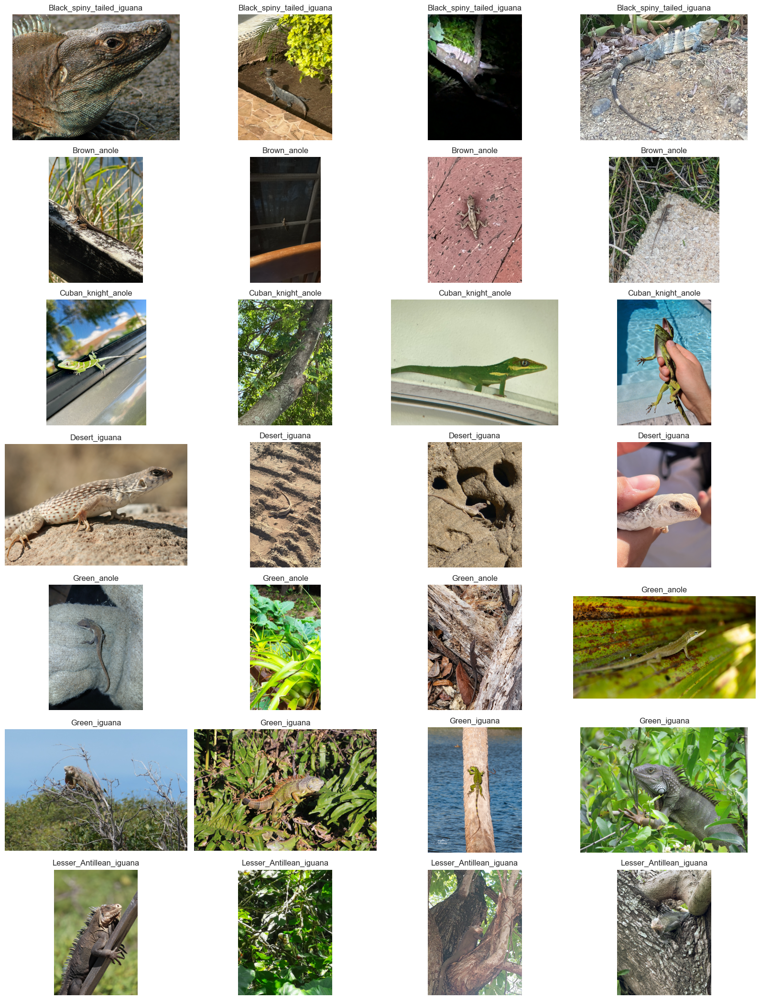

In [9]:
def show_class_examples(df: pd.DataFrame, n_per_class: int = 4) -> None:
    fig, axes = plt.subplots(num_classes, n_per_class, figsize=(4 * n_per_class, 3 * num_classes))
    axes = np.atleast_2d(axes)
    for row_idx, label in enumerate(sorted(label_to_class)):
        subset = df[df["label"] == label].sample(n_per_class, random_state=SEED)
        for col_idx, (_, row) in enumerate(subset.reset_index(drop=True).iterrows()):
            with Image.open(row["path"]) as img:
                axes[row_idx, col_idx].imshow(ImageOps.exif_transpose(img).convert("RGB"))
            axes[row_idx, col_idx].set_title(label_to_class[label])
            axes[row_idx, col_idx].axis("off")
    plt.tight_layout()
    plt.show()

show_class_examples(train_df, n_per_class=4)

### 1C. Image Quality and Resolution Statistics

Image sizes, brightness, and blur can affect training.  
We inspect them to catch extreme outliers and to justify resizing all images consistently.

,split,n_images,width_min,width_median,width_max,height_min,height_median,height_max,brightness_median
0,train,1178,282,1536,2048,293,2048,2048,119.76
1,test,326,395,1536,2048,499,2048,2048,120.76


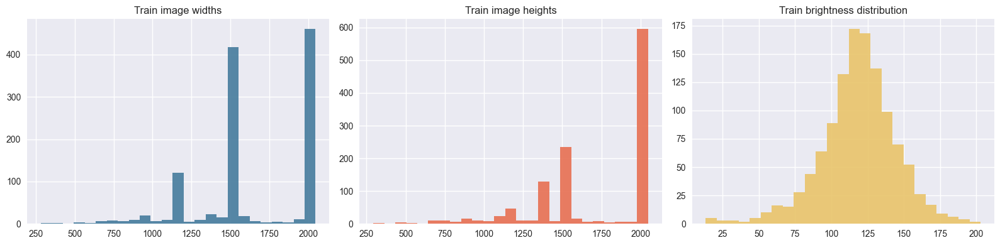

In [10]:
def collect_image_stats(paths: list[Path]) -> pd.DataFrame:
    records = []
    for path in paths:
        with Image.open(path) as img:
            rgb = ImageOps.exif_transpose(img).convert("RGB")
            gray = np.asarray(rgb.convert("L"))
            width, height = rgb.size
        records.append(
            {
                "path": path,
                "width": width,
                "height": height,
                "aspect_ratio": width / height,
                "brightness": float(gray.mean()),
                "blur_laplacian_var": float(cv2.Laplacian(gray, cv2.CV_64F).var()),
            }
        )
    return pd.DataFrame(records)

train_stats = collect_image_stats(train_df["path"].tolist())
test_stats = collect_image_stats(test_df["path"].tolist())

eda_summary = pd.DataFrame(
    {
        "split": ["train", "test"],
        "n_images": [len(train_stats), len(test_stats)],
        "width_min": [train_stats["width"].min(), test_stats["width"].min()],
        "width_median": [int(train_stats["width"].median()), int(test_stats["width"].median())],
        "width_max": [train_stats["width"].max(), test_stats["width"].max()],
        "height_min": [train_stats["height"].min(), test_stats["height"].min()],
        "height_median": [int(train_stats["height"].median()), int(test_stats["height"].median())],
        "height_max": [train_stats["height"].max(), test_stats["height"].max()],
        "brightness_median": [round(train_stats["brightness"].median(), 2), round(test_stats["brightness"].median(), 2)],
    }
)
display(eda_summary)

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
axes[0].hist(train_stats["width"], bins=25, color="#457b9d", alpha=0.9)
axes[0].set_title("Train image widths")
axes[1].hist(train_stats["height"], bins=25, color="#e76f51", alpha=0.9)
axes[1].set_title("Train image heights")
axes[2].hist(train_stats["brightness"], bins=25, color="#e9c46a", alpha=0.9)
axes[2].set_title("Train brightness distribution")
plt.tight_layout()
plt.show()

### 1D. Duplicate Detection

We calculate a simple perceptual hash so near-duplicate images can stay in the same train/validation group.  
This reduces validation leakage: the model should not see almost the same image during training and validation.

In [11]:
def average_hash(path: Path, hash_size: int = 16) -> str:
    with Image.open(path) as img:
        gray = ImageOps.exif_transpose(img).convert("L").resize(
            (hash_size, hash_size),
            Image.Resampling.BILINEAR,
        )
        arr = np.asarray(gray, dtype=np.float32)
    return "".join("1" if pixel > arr.mean() else "0" for pixel in arr.flatten())

train_df["hash_group"] = train_df["path"].map(average_hash)

hash_group_sizes = train_df.groupby("hash_group").size().sort_values(ascending=False)
duplicate_groups = hash_group_sizes[hash_group_sizes > 1]

print("Approximate duplicate groups:", len(duplicate_groups))
if len(duplicate_groups) > 0:
    print("Largest duplicate group size:", int(duplicate_groups.iloc[0]))
    duplicate_preview = (
        train_df[train_df["hash_group"].isin(duplicate_groups.index[:5])]
        .sort_values(["hash_group", "class_name", "id"])
        [["id", "class_name", "hash_group"]]
        .reset_index(drop=True)
    )
    display(duplicate_preview.head(20))

Approximate duplicate groups: 18
Largest duplicate group size: 2


,id,class_name,hash_group
0,Brown_anole_Anolis_carolinensis_17.jpg,Brown_anole,0000000000000000000000000000000000111100000000...
1,Green_anole_Green_anole_17.jpg,Green_anole,0000000000000000000000000000000000111100000000...
2,Black_spiny-tailed_iguana_Ctenosaura_similis_1...,Black_spiny_tailed_iguana,0000010000000000000000000001100000000000011100...
3,Green_iguana_Green_iguana_205.jpg,Green_iguana,0000010000000000000000000001100000000000011100...
4,Brown_anole_Anolis_carolinensis_16.jpg,Brown_anole,0000111000000000000111111001000000011111110000...
5,Green_anole_Green_anole_16.jpg,Green_anole,0000111000000000000111111001000000011111110000...
6,Brown_anole_Anolis_carolinensis_13.jpg,Brown_anole,0001110000111000000111001011100101001110000010...
7,Green_anole_Green_anole_53.jpg,Green_anole,0001110000111000000111001011100101001110000010...
8,Brown_anole_Anolis_carolinensis_20.jpg,Brown_anole,1101011100001100111101110000100011111110000110...
9,Green_anole_Green_anole_20.jpg,Green_anole,1101011100001100111101110000100011111110000110...


### 1E. Text or Watermark Review

Text overlays can accidentally leak information or distract the model.  
We do not blindly remove these images, but we score them so they can be inspected and discussed.

In [12]:
def text_overlay_score(path: Path) -> int:
    image = cv2.imread(str(path))
    if image is None:
        return -1
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (512, 512))
    gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, np.ones((3, 3), np.uint8))
    _, thresh = cv2.threshold(gradient, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (11, 3))
    merged = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
    contours, _ = cv2.findContours(merged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    candidates = 0
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        area = w * h
        aspect_ratio = w / max(h, 1)
        if 60 <= area <= 6000 and aspect_ratio > 1.8 and h < 70:
            candidates += 1
    return candidates

sample_parts = []
for _, subset in train_df.groupby("label"):
    sample_parts.append(subset.sample(min(len(subset), 25), random_state=SEED))
text_check_df = pd.concat(sample_parts).reset_index(drop=True)
text_check_df["text_overlay_score"] = text_check_df["path"].map(text_overlay_score)

ocr_available = False
pytesseract = None
try:
    import pytesseract  # type: ignore
    ocr_available = shutil.which("tesseract") is not None
except Exception:
    pytesseract = None

if ocr_available:
    def extract_text(path: Path) -> str:
        text = pytesseract.image_to_string(str(path), config="--psm 11")
        return " ".join(text.split())

    text_check_df["ocr_text"] = text_check_df["path"].map(extract_text)
    text_check_df["has_ocr_text"] = text_check_df["ocr_text"].str.len() >= 4
    display(
        text_check_df.sort_values(
            ["has_ocr_text", "text_overlay_score"],
            ascending=[False, False],
        )[["id", "class_name", "text_overlay_score", "ocr_text"]].head(15)
    )
else:
    print("pytesseract / Tesseract not available in this environment.")
    print("Fallback: OpenCV text-overlay heuristic only.")
    display(
        text_check_df.sort_values("text_overlay_score", ascending=False)[
            ["id", "class_name", "text_overlay_score"]
        ].head(15)
    )

pytesseract / Tesseract not available in this environment.
Fallback: OpenCV text-overlay heuristic only.


,id,class_name,text_overlay_score
82,Desert_iguana_Desert_iguana_129.jpg,Desert_iguana,60
38,Brown_anole_Brown_anole_104.jpg,Brown_anole,52
27,Brown_anole_Brown_anole_26.jpg,Brown_anole,52
170,Lesser_Antillean_iguana_Lesser_Antillean_iguan...,Lesser_Antillean_iguana,51
133,Green_iguana_Green_iguana_20.jpg,Green_iguana,50
56,Cuban_knight_anole_Cuban_knight_anole_177.jpg,Cuban_knight_anole,47
97,Desert_iguana_Desert_iguana_105.jpg,Desert_iguana,46
20,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,Black_spiny_tailed_iguana,43
117,Green_anole_Green_anole_95.jpg,Green_anole,42
149,Green_iguana_Green_iguana_153.jpg,Green_iguana,40


## 1F. Automatic Dataset Cleaning

Before splitting the data, we remove only high-confidence problems:

- duplicate hash groups that appear with multiple labels
- unreadable image rows
- images with extremely unusual aspect ratios

Blur and possible text overlays are kept as review signals instead of being removed blindly, because those can still be real challenge images.

### 1G. Conservative Cleaning Rules

The cleaning is deliberately conservative.  
We remove only rows that are very likely to be problematic, while keeping review columns for softer quality signals.

In [13]:
def build_clean_training_dataframe(df: pd.DataFrame, stats: pd.DataFrame) -> tuple[pd.DataFrame, pd.DataFrame]:
    working_df = df.copy()
    working_df["path_str"] = working_df["path"].astype(str)

    quality_df = stats.copy()
    quality_df["path_str"] = quality_df["path"].astype(str)
    quality_df = quality_df[["path_str", "aspect_ratio", "blur_laplacian_var", "brightness"]]
    working_df = working_df.merge(quality_df, on="path_str", how="left")

    hash_label_counts = working_df.groupby("hash_group")["label"].nunique()
    conflicting_hashes = set(hash_label_counts[hash_label_counts > 1].index)

    low_blur_threshold = float(working_df["blur_laplacian_var"].quantile(0.01))
    high_text_threshold = int(text_check_df["text_overlay_score"].quantile(0.95))
    sampled_text_scores = text_check_df.set_index("path")["text_overlay_score"].to_dict()

    working_df["cleaning_reason"] = ""
    working_df.loc[working_df["path"].isna(), "cleaning_reason"] = "missing_image_path"
    working_df.loc[working_df["hash_group"].isin(conflicting_hashes), "cleaning_reason"] = "conflicting_duplicate_hash"
    working_df.loc[
        (working_df["aspect_ratio"] < 0.25) | (working_df["aspect_ratio"] > 4.0),
        "cleaning_reason",
    ] = "extreme_aspect_ratio"

    working_df["review_low_blur"] = working_df["blur_laplacian_var"] <= low_blur_threshold
    working_df["review_text_overlay_score"] = working_df["path"].map(sampled_text_scores).fillna(0).astype(int)
    working_df["review_possible_text_overlay"] = working_df["review_text_overlay_score"] >= high_text_threshold

    removed_df = working_df[working_df["cleaning_reason"] != ""].copy()
    clean_df = working_df[working_df["cleaning_reason"] == ""].copy()
    clean_df = clean_df.drop(columns=["path_str"]).reset_index(drop=True)

    cleaning_summary = pd.DataFrame(
        {
            "step": [
                "original_rows",
                "removed_rows",
                "clean_rows",
                "review_low_blur_rows",
                "review_possible_text_overlay_rows",
            ],
            "count": [
                len(working_df),
                len(removed_df),
                len(clean_df),
                int(clean_df["review_low_blur"].sum()),
                int(clean_df["review_possible_text_overlay"].sum()),
            ],
        }
    )

    display(cleaning_summary)
    if len(removed_df) > 0:
        display(
            removed_df[
                ["id", "class_name", "hash_group", "cleaning_reason"]
            ].sort_values(["cleaning_reason", "class_name", "id"]).head(30)
        )
    return clean_df, removed_df

clean_train_df, removed_train_df = build_clean_training_dataframe(train_df, train_stats)

print("Rows available after automatic cleaning:", len(clean_train_df))
display(
    clean_train_df.groupby(["label", "class_name"])
    .size()
    .reset_index(name="clean_count")
    .sort_values("label")
)

,step,count
0,original_rows,1178
1,removed_rows,36
2,clean_rows,1142
3,review_low_blur_rows,12
4,review_possible_text_overlay_rows,10


,id,class_name,hash_group,cleaning_reason
169,Black_spiny-tailed_iguana_Ctenosaura_similis_1...,Black_spiny_tailed_iguana,0000010000000000000000000001100000000000011100...,conflicting_duplicate_hash
170,Brown_anole_Anolis_carolinensis_1.jpg,Brown_anole,1111111100000000111111111111100011111111111110...,conflicting_duplicate_hash
171,Brown_anole_Anolis_carolinensis_10.jpg,Brown_anole,0000001110000110000000111000011000000011110001...,conflicting_duplicate_hash
172,Brown_anole_Anolis_carolinensis_12.jpg,Brown_anole,0110110111111110101101111111111011111111111110...,conflicting_duplicate_hash
173,Brown_anole_Anolis_carolinensis_13.jpg,Brown_anole,0001110000111000000111001011100101001110000010...,conflicting_duplicate_hash
174,Brown_anole_Anolis_carolinensis_14.jpg,Brown_anole,1111111111111111111111111111111111000001111111...,conflicting_duplicate_hash
175,Brown_anole_Anolis_carolinensis_16.jpg,Brown_anole,0000111000000000000111111001000000011111110000...,conflicting_duplicate_hash
176,Brown_anole_Anolis_carolinensis_17.jpg,Brown_anole,0000000000000000000000000000000000111100000000...,conflicting_duplicate_hash
177,Brown_anole_Anolis_carolinensis_18.jpg,Brown_anole,1111111111111111111111111111111111111111111111...,conflicting_duplicate_hash
178,Brown_anole_Anolis_carolinensis_19.jpg,Brown_anole,1000011111000111111111000001111111111111000111...,conflicting_duplicate_hash


Rows available after automatic cleaning: 1142


,label,class_name,clean_count
0,0,Black_spiny_tailed_iguana,169
1,1,Brown_anole,165
2,2,Cuban_knight_anole,157
3,3,Desert_iguana,157
4,4,Green_anole,151
5,5,Green_iguana,178
6,6,Lesser_Antillean_iguana,165


## 2. Validation Strategy

A random split can be misleading when the dataset contains duplicate or near-duplicate images.  
To reduce leakage, we first create image hash groups and then do a **stratified group split**:

- class balance stays similar in train and validation
- images with the same hash group stay together
- validation macro-F1 becomes more trustworthy

### 2A. Duplicate-Aware Split Function

A normal random split can put near-duplicates in both train and validation.  
This function splits by `hash_group`, so similar images stay together and the validation score is harder to game.

In [14]:
def stratified_group_split(df: pd.DataFrame, val_fraction: float = 0.2, seed: int = 12) -> tuple[pd.DataFrame, pd.DataFrame]:
    if not 0 < val_fraction < 1:
        raise ValueError("val_fraction must be between 0 and 1.")

    try:
        from sklearn.model_selection import StratifiedGroupKFold
    except ImportError:
        StratifiedGroupKFold = None

    if StratifiedGroupKFold is not None:
        n_splits = max(2, int(round(1 / val_fraction)))
        n_splits = min(n_splits, df["hash_group"].nunique())
        splitter = StratifiedGroupKFold(n_splits=n_splits, shuffle=True, random_state=seed)

        X = np.zeros(len(df))
        y = df["label"].to_numpy()
        groups = df["hash_group"].to_numpy()

        target_total = len(df) * val_fraction
        target_per_label = df["label"].value_counts().sort_index() * val_fraction
        best_split: tuple[np.ndarray, np.ndarray] | None = None
        best_score = float("inf")

        for train_idx, val_idx in splitter.split(X, y, groups):
            val_labels = pd.Series(y[val_idx]).value_counts().reindex(target_per_label.index, fill_value=0)
            size_penalty = abs(len(val_idx) - target_total) / max(target_total, 1)
            class_penalty = float(((val_labels - target_per_label).abs() / target_per_label.clip(lower=1)).fillna(0).mean())
            score = size_penalty + class_penalty
            if score < best_score:
                best_score = score
                best_split = (train_idx, val_idx)

        if best_split is not None:
            train_idx, val_idx = best_split
            train_split = df.iloc[train_idx].sample(frac=1.0, random_state=seed).reset_index(drop=True)
            val_split = df.iloc[val_idx].sample(frac=1.0, random_state=seed).reset_index(drop=True)
            return train_split, val_split

    rng = np.random.default_rng(seed)
    target_total = int(round(len(df) * val_fraction))
    target_per_label = df["label"].value_counts().sort_index() * val_fraction

    group_rows = []
    for hash_group, subset in df.groupby("hash_group"):
        label_counts = subset["label"].value_counts().sort_index()
        row = {
            "hash_group": hash_group,
            "group_size": len(subset),
        }
        for label in sorted(label_to_class):
            row[f"label_{label}"] = int(label_counts.get(label, 0))
        group_rows.append(row)

    group_df = pd.DataFrame(group_rows)
    group_df = group_df.sample(frac=1.0, random_state=seed).sort_values("group_size", ascending=False).reset_index(drop=True)

    val_groups = []
    val_total = 0
    current_counts = pd.Series(0.0, index=target_per_label.index)

    for row in group_df.itertuples(index=False):
        row_counts = pd.Series(
            {label: getattr(row, f"label_{label}") for label in target_per_label.index},
            dtype=float,
        )

        remaining_deficit = (target_per_label - current_counts).clip(lower=0)
        group_fills_needed_labels = float((np.minimum(row_counts, remaining_deficit)).sum())
        should_add = False
        if val_total < target_total and group_fills_needed_labels > 0:
            should_add = True
        elif val_total + row.group_size <= target_total and len(val_groups) == 0:
            should_add = True

        if should_add:
            val_groups.append(row.hash_group)
            current_counts += row_counts
            val_total += int(row.group_size)

    if not val_groups:
        val_groups = group_df.head(1)["hash_group"].tolist()

    mask = df["hash_group"].isin(val_groups)
    train_split = df[~mask].sample(frac=1.0, random_state=seed).reset_index(drop=True)
    val_split = df[mask].sample(frac=1.0, random_state=seed).reset_index(drop=True)
    return train_split, val_split

if "hash_group" not in clean_train_df.columns:
    clean_train_df["hash_group"] = clean_train_df["path"].map(average_hash)

train_split, val_split = stratified_group_split(clean_train_df, val_fraction=VAL_FRACTION, seed=SEED)

print("Train split shape:", train_split.shape)
print("Validation split shape:", val_split.shape)
print("Hash overlap:", len(set(train_split["hash_group"]) & set(val_split["hash_group"])))

split_summary = pd.DataFrame(
    {
        "class_name": class_names,
        "train_count": train_split["label"].value_counts().reindex(sorted(label_to_class), fill_value=0).values,
        "val_count": val_split["label"].value_counts().reindex(sorted(label_to_class), fill_value=0).values,
    }
)
split_summary["val_share_pct"] = (100 * split_summary["val_count"] / (split_summary["train_count"] + split_summary["val_count"])).round(2)
display(split_summary)

Train split shape: (914, 12)
Validation split shape: (228, 12)
Hash overlap: 0


,class_name,train_count,val_count,val_share_pct
0,Black_spiny_tailed_iguana,138,31,18.34
1,Brown_anole,132,33,20.00
2,Cuban_knight_anole,125,32,20.38
3,Desert_iguana,125,32,20.38
4,Green_anole,120,31,20.53
5,Green_iguana,142,36,20.22
6,Lesser_Antillean_iguana,132,33,20.00


## 3. TensorFlow / Keras Input Pipeline

We keep the pipeline fully inside TensorFlow:

- file paths are read from the CSV-driven dataframe
- images are decoded and resized on the fly
- augmentation is done with Keras preprocessing layers
- `tf.data` takes care of batching and prefetching

### 3A. Augmentation and Dataset Builders

Augmentation is applied only to training images.  
Validation and test images are resized in the same way but not augmented, so evaluation stays stable and comparable.

In [15]:
def make_data_augmentation(strength: float = 1.0) -> keras.Sequential:
    return keras.Sequential(
        [
            layers.RandomFlip("horizontal"),
            layers.RandomRotation(0.08 * strength),
            layers.RandomZoom(0.15 * strength),
            layers.RandomContrast(0.15 * strength),
            layers.RandomTranslation(0.05 * strength, 0.05 * strength),
        ],
        name="augmentation",
    )

data_augmentation = make_data_augmentation(TRAINING_AUGMENTATION_STRENGTH)

def resize_for_model(image: tf.Tensor, training: bool) -> tf.Tensor:
    image = tf.image.resize(image, IMG_SIZE, method=tf.image.ResizeMethod.BICUBIC)
    return tf.clip_by_value(image, 0.0, 255.0)

@tf.autograph.experimental.do_not_convert
def decode_image(path: tf.Tensor, label: tf.Tensor | None = None, training: bool = False):
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image, channels=3, expand_animations=False)
    image = tf.cast(image, tf.float32)
    image.set_shape([None, None, 3])
    image = resize_for_model(image, training=training)
    if label is None:
        return image
    return image, tf.cast(label, tf.int32)

def make_labeled_dataset(df: pd.DataFrame, training: bool = False) -> tf.data.Dataset:
    @tf.autograph.experimental.do_not_convert
    def decode_labeled(path: tf.Tensor, label: tf.Tensor):
        return decode_image(path, label, training=training)

    dataset = tf.data.Dataset.from_tensor_slices(
        (df["path"].astype(str).values, df["label"].values.astype("int32"))
    )
    dataset = dataset.map(decode_labeled, num_parallel_calls=AUTOTUNE)
    if not training:
        dataset = dataset.cache()
    if training:
        dataset = dataset.shuffle(len(df), seed=SEED, reshuffle_each_iteration=True)
    dataset = dataset.batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return dataset

def make_test_dataset(df: pd.DataFrame) -> tf.data.Dataset:
    @tf.autograph.experimental.do_not_convert
    def decode_unlabeled(path: tf.Tensor):
        return decode_image(path, training=False)

    dataset = tf.data.Dataset.from_tensor_slices(df["path"].astype(str).values)
    dataset = dataset.map(decode_unlabeled, num_parallel_calls=AUTOTUNE)
    dataset = dataset.cache()
    dataset = dataset.batch(BATCH_SIZE).prefetch(AUTOTUNE)
    return dataset

train_ds = make_labeled_dataset(train_split, training=True)
train_eval_ds = make_labeled_dataset(train_split, training=False)
val_ds = make_labeled_dataset(val_split, training=False)
test_ds = make_test_dataset(test_df)

for images, labels in train_ds.take(1):
    print("Image batch shape:", images.shape)
    print("Label batch shape:", labels.shape)

Image batch shape: (24, 260, 260, 3)
Label batch shape: (24,)


## 4. Transfer Learning Model

The best-performing setup on our validation split is a **two-stage EfficientNetB0 transfer-learning pipeline**:

1. train only the classification head for a few epochs
2. unfreeze the top backbone layers and continue with a smaller learning rate

For report transparency, the earlier frozen-backbone + Optuna-style settings are kept in the notebook as commented reference values and in the ablation section below.

### 4A. Model Architecture Choice

We use **EfficientNetB0** because it is a strong ImageNet-pretrained backbone that is still light enough to train on Colab or a normal laptop.  
The custom head adds batch normalization and dropout to reduce overfitting, which is important because this dataset is small.

The named layers `gradcam_features` and `embedding_features` are intentional:

- `gradcam_features` lets us explain predictions with Grad-CAM later.
- `embedding_features` lets us compare images in feature space for the kNN/blend inference step.

In [16]:
def build_transfer_model(
    input_shape: tuple[int, int, int] = IMG_SIZE + (3,),
    num_classes: int = 7,
    dropout_rate: float = DROPOUT_RATE,
    weights: str | None = "imagenet",
) -> tuple[keras.Model, keras.Model]:
    try:
        backbone = keras.applications.ResNet50(
            include_top=False,
            weights=weights,
            input_shape=input_shape,
        )
        print("Loaded ResNet50 with ImageNet weights.")
    except Exception as exc:
        print(f"Could not load pretrained weights ({exc}). Falling back to random initialization.")
        backbone = keras.applications.ResNet50(
            include_top=False,
            weights=None,
            input_shape=input_shape,
        )

    backbone.trainable = False
    for layer in backbone.layers:
        layer.trainable = False

    inputs = keras.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = keras.applications.resnet.preprocess_input(x)
    x = backbone(x, training=False)
    x = layers.Activation("linear", name="gradcam_features")(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(dropout_rate)(x)
    x = layers.Activation("linear", name="embedding_features")(x)
    outputs = layers.Dense(
        num_classes,
        activation="softmax",
        dtype="float32",
    )(x)

    model = keras.Model(inputs, outputs, name="lizard_classifier_resnet50")
    return model, backbone

### 4B. Class Weights and Validation Metrics

Accuracy is useful, but macro-F1 tells us whether the model performs fairly across all species.  
We calculate both during training and use class weights so smaller classes are not ignored.

In [17]:
def make_class_weights(labels: pd.Series) -> dict[int, float]:
    counts = labels.value_counts().to_dict()
    total = len(labels)
    n_classes = len(counts)
    return {int(label): total / (n_classes * count) for label, count in counts.items()}

def get_optional_class_weights(labels: pd.Series) -> dict[int, float] | None:
    if not USE_CLASS_WEIGHTS:
        return None
    return make_class_weights(labels)

def metrics_from_confusion_matrix(cm: np.ndarray) -> tuple[np.ndarray, np.ndarray, np.ndarray, float]:
    true_positives = np.diag(cm).astype(np.float64)
    precision = np.divide(
        true_positives,
        cm.sum(axis=0),
        out=np.zeros_like(true_positives),
        where=cm.sum(axis=0) != 0,
    )
    recall = np.divide(
        true_positives,
        cm.sum(axis=1),
        out=np.zeros_like(true_positives),
        where=cm.sum(axis=1) != 0,
    )
    f1 = np.divide(
        2 * precision * recall,
        precision + recall,
        out=np.zeros_like(true_positives),
        where=(precision + recall) != 0,
    )
    return precision, recall, f1, float(f1.mean())

class ValidationMacroF1Callback(keras.callbacks.Callback):
    def __init__(self, validation_data: tf.data.Dataset, targets: np.ndarray) -> None:
        super().__init__()
        self.validation_data = validation_data
        self.targets = targets
        self.history: list[dict[str, float]] = []

    def on_epoch_end(self, epoch: int, logs: dict | None = None) -> None:
        if logs is None:
            logs = {}
        probabilities = self.model.predict(self.validation_data, verbose=0)
        predictions = probabilities.argmax(axis=1)
        confusion = tf.math.confusion_matrix(
            self.targets,
            predictions,
            num_classes=num_classes,
        ).numpy()
        _, _, _, macro_f1 = metrics_from_confusion_matrix(confusion)
        accuracy = float((predictions == self.targets).mean())
        logs["val_macro_f1"] = macro_f1
        logs["val_eval_accuracy"] = accuracy
        self.history.append(
            {
                "epoch": float(epoch + 1),
                "val_macro_f1": macro_f1,
                "val_eval_accuracy": accuracy,
            }
        )
        print(
            f"Epoch {epoch + 1}: val_macro_f1={macro_f1:.4f} - "
            f"val_eval_accuracy={accuracy:.4f}"
        )

### 4C. Training Callbacks

The callbacks make training more stable and defendable:

- `ModelCheckpoint` keeps the best validation model, not just the last epoch.
- `EarlyStopping` prevents wasting epochs once validation stops improving.
- `ReduceLROnPlateau` lowers the learning rate when the model gets stuck.

In [18]:
class_weights = get_optional_class_weights(train_split["label"])
val_targets = val_split["label"].to_numpy()

def compile_model(model: keras.Model, learning_rate: float | object) -> None:
    """
    Compile model with optimizer using optional learning rate schedule.
    
    Args:
        model: Keras model to compile
        learning_rate: Float or learning rate schedule object
    """
    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    model.compile(
        optimizer=optimizer,
        loss=keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"],
    )

def make_training_callbacks(
    checkpoint_path: Path,
    verbose: int = 1,
    include_advanced_features: bool = True,
) -> tuple[list[keras.callbacks.Callback], object]:
    """
    Create training callbacks including TensorBoard and WandB if enabled.
    
    Args:
        checkpoint_path: Path to save best model
        verbose: Verbosity level
        include_advanced_features: Whether to include TensorBoard/WandB callbacks
    
    Returns:
        Tuple of (callbacks list, val_macro_f1_callback)
    """
    val_macro_f1_callback = ValidationMacroF1Callback(val_ds, val_targets)
    callbacks = [
        val_macro_f1_callback,
        keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            monitor="val_macro_f1",
            mode="max",
            save_best_only=True,
            verbose=verbose,
        ),
        keras.callbacks.EarlyStopping(
            monitor="val_macro_f1",
            mode="max",
            patience=6,
            min_delta=0.001,
            restore_best_weights=True,
            verbose=verbose,
        ),
        keras.callbacks.TerminateOnNaN(),
    ]

    # ReduceLROnPlateau is useful with a fixed learning rate, but it can conflict
    # with TensorFlow LearningRateSchedule objects. We use schedules in this
    # notebook, so the plateau callback is kept as a documented fallback only.
    if LR_SCHEDULE_TYPE in {"constant", "none", None}:
        callbacks.append(
            keras.callbacks.ReduceLROnPlateau(
                monitor="val_loss",
                factor=0.3,
                patience=2,
                mode="min",
                min_lr=1e-6,
                verbose=verbose,
            )
        )
    
    # Add TensorBoard callback
    if include_advanced_features and USE_TENSORBOARD and TensorBoard is not None:
        log_dir = ROOT / "artifacts" / "logs" / "training_session" / datetime.now().strftime("%Y%m%d_%H%M%S")
        log_dir.mkdir(parents=True, exist_ok=True)
        
        tensorboard_callback = keras.callbacks.TensorBoard(
            log_dir=str(log_dir),
            histogram_freq=1,  # Compute activation histograms every epoch
            write_graph=True,
            update_freq="epoch",
            profile_batch=0,  # Keep TensorBoard lightweight and avoid profiling overhead
        )
        callbacks.append(tensorboard_callback)
        print(f"TensorBoard logging to: {log_dir}")
        print(f"View with: tensorboard --logdir {ROOT / 'artifacts' / 'logs'}")
    
    # Add WandB callback (optional)
    if include_advanced_features and USE_WANDB and WANDB_AVAILABLE:
        try:
            wandb.init(
                project="lizard-classification",
                config={
                    "initial_epochs": INITIAL_EPOCHS,
                    "fine_tune_epochs": FINE_TUNE_EPOCHS,
                    "batch_size": BATCH_SIZE,
                    "learning_rate_schedule": LR_SCHEDULE_TYPE,
                    "head_lr": HEAD_LEARNING_RATE,
                    "finetune_lr": FINE_TUNE_LEARNING_RATE,
                },
                reinit=True,
            )
            wandb_callback = keras.callbacks.WandbCallback(
                monitor="val_eval_accuracy",
                log_weights=True,
                log_model=False,
            )
            callbacks.append(wandb_callback)
            print("WandB callback enabled")
        except Exception as e:
            print(f"Could not initialize WandB: {e}")
    
    return callbacks, val_macro_f1_callback

def unfreeze_top_layers(backbone_model: keras.Model, n_layers: int = FINE_TUNE_LAYERS) -> None:
    backbone_model.trainable = True
    for layer in backbone_model.layers[:-n_layers]:
        layer.trainable = False
    for layer in backbone_model.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = False

### 4D. Staged Fine-Tuning

We train in two phases.  
First only the new classification head learns the lizard classes. Then we unfreeze the top EfficientNet layers with a much smaller learning rate, so the model can adapt to lizard-specific details without destroying the useful ImageNet features.

The earlier frozen-only/Optuna attempt is kept as comments below for the report, because it shows that we tried a simpler approach before moving to staged fine-tuning.

In [19]:
# Previous frozen-only attempt kept here for the report:
# FINAL_EPOCHS = 10
# RUN_OPTUNA = True
# OPTUNA_TRIALS = 3
# OPTUNA_EPOCHS = 2
# USE_CLASS_WEIGHTS = False
# DEFAULT_MODEL_PARAMS = {
#     "learning_rate": 1e-4,
#     "dropout_rate": 0.55,
#     "dense_units": 64,
#     "augmentation_strength": 0.6,
#     "weight_decay": 1e-4,
# }

checkpoint_path = ROOT / "best_lizard_model_resnet50.keras"
model, backbone = build_transfer_model(num_classes=num_classes)

# Create learning rate schedules for both training phases
steps_per_epoch_train = math.ceil(len(train_split) / BATCH_SIZE)

# Head training phase schedule
head_lr_schedule = create_learning_rate_schedule(
    initial_lr=HEAD_LEARNING_RATE,
    total_epochs=INITIAL_EPOCHS,
    steps_per_epoch=steps_per_epoch_train,
    schedule_type=LR_SCHEDULE_TYPE,
)

# Fine-tuning phase schedule
finetune_lr_schedule = create_learning_rate_schedule(
    initial_lr=FINE_TUNE_LEARNING_RATE,
    total_epochs=FINE_TUNE_EPOCHS,
    steps_per_epoch=steps_per_epoch_train,
    schedule_type=LR_SCHEDULE_TYPE,
)

# Get callbacks with advanced features
callbacks, val_macro_f1_callback = make_training_callbacks(
    checkpoint_path=checkpoint_path,
    verbose=1,
    include_advanced_features=True,
)

# ===== Phase 1: Train classification head with frozen backbone =====
print("=" * 60)
print("PHASE 1: Training classification head (backbone frozen)")
print("=" * 60)
print(f"Learning rate schedule: {LR_SCHEDULE_TYPE}")
print(f"Initial learning rate: {HEAD_LEARNING_RATE}")
print(f"Epochs: {INITIAL_EPOCHS}")
print()

compile_model(model, learning_rate=head_lr_schedule)
history_head = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=INITIAL_EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1,
)

# ===== Phase 2: Fine-tune top backbone layers with smaller learning rate =====
print("\n" + "=" * 60)
print("PHASE 2: Fine-tuning top backbone layers")
print("=" * 60)
print(f"Learning rate schedule: {LR_SCHEDULE_TYPE}")
print(f"Initial learning rate: {FINE_TUNE_LEARNING_RATE}")
print(f"Epochs: {FINE_TUNE_EPOCHS}")
print(f"Unfrozen backbone layers: {FINE_TUNE_LAYERS}")
print()

unfreeze_top_layers(backbone, n_layers=FINE_TUNE_LAYERS)
compile_model(model, learning_rate=finetune_lr_schedule)
history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=FINE_TUNE_EPOCHS,
    class_weight=class_weights,
    callbacks=callbacks,
    verbose=1,
)

# Close WandB session if it was used
if USE_WANDB and WANDB_AVAILABLE:
    try:
        wandb.finish()
    except Exception:
        pass

model = keras.models.load_model(checkpoint_path)

model.summary()
print("Class weights:", class_weights)
print("Training plan: staged fine-tuning with learning rate schedule")
print("Head learning rate schedule:", LR_SCHEDULE_TYPE)
print("Fine-tune learning rate schedule:", LR_SCHEDULE_TYPE)
print("Fine-tuned backbone layers:", FINE_TUNE_LAYERS)
print("Primary selection metric: validation loss, with accuracy and macro-F1 reported separately")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 11s 0us/step
Loaded ResNet50 with ImageNet weights.
TensorBoard logging to: C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\artifacts\logs\training_session\20260503_105301
View with: tensorboard --logdir C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\artifacts\logs
PHASE 1: Training classification head (backbone frozen)
Learning rate schedule: cosine_annealing
Initial learning rate: 0.0002
Epochs: 8

Epoch 1/8
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 889ms/step - accuracy: 0.1537 - loss: 2.9263Epoch 1: val_macro_f1=0.1619 - val_eval_accuracy=0.2018

Epoch 1: val_macro_f1 improved from None to 0.16186, saving model to C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\best_lizard_model_resnet50.keras

Epoch 1: finished saving model to C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\best_lizard_model_resnet50.keras
39/39 ━━━━━━━━━━━━━━━━━━━━ 79s 2s/step - accuracy: 0.1871 - loss: 2.7492 - val_accuracy: 0.2018 - val_los

Model: "lizard_classifier_resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 260, 260,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ augmentation        │ (None, 260, 260,  │          0 │ input_layer_1[0]… │
│ (Sequential)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 260, 260)  │          0 │ augmentation[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 260, 260)  │          0 │ augmentation[0][… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 260, 260)  │          0 │ augmentation[0][… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 260, 260,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 260, 260,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 9, 9,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gradcam_features    │ (None, 9, 9,      │          0 │ resnet50[0][0]    │
│ (Activation)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ gradcam_features… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 2048)      │      8,192 │ global_average_p… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 2048)      │          0 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_features  │ (None, 2048)      │          0 │ dropout[0][0]     │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 7)         │     14,343 │ embedding_featur… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 52,504,470 (200.29 MB)

 Trainable params: 14,447,111 (55.11 MB)

 Non-trainable params: 9,163,136 (34.95 MB)

 Optimizer params: 28,894,223 (110.22 MB)

Class weights: {5: 0.9195171026156942, 0: 0.9461697722567288, 6: 0.9891774891774892, 1: 0.9891774891774892, 2: 1.0445714285714285, 3: 1.0445714285714285, 4: 1.088095238095238}
Training plan: staged fine-tuning with learning rate schedule
Head learning rate schedule: cosine_annealing
Fine-tune learning rate schedule: cosine_annealing
Fine-tuned backbone layers: 30
Primary selection metric: validation loss, with accuracy and macro-F1 reported separately


### 4E. Training Curves

We combine the head-training and fine-tuning histories into one table.  
The plots make it easy to see whether the model is learning, overfitting, or improving after the backbone is partly unfrozen.

,accuracy,loss,val_accuracy,val_loss,val_macro_f1,val_eval_accuracy,epoch
15,0.666302,0.985545,0.561404,1.299291,0.556842,0.561404,16
16,0.625821,0.989829,0.565789,1.289033,0.559125,0.565789,17
17,0.633479,0.957905,0.561404,1.296506,0.553721,0.561404,18
18,0.675055,0.902702,0.565789,1.292727,0.561398,0.565789,19
19,0.657549,0.915444,0.565789,1.281411,0.558598,0.565789,20


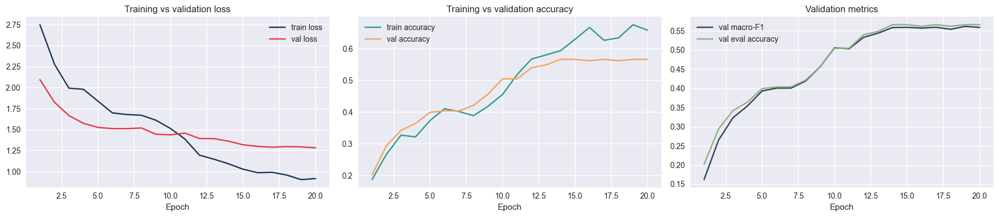

,epochs_ran,train_loss_start,train_loss_final,train_loss_min,train_loss_delta,train_loss_down_ratio,val_loss_start,val_loss_final,val_loss_min,val_loss_delta,val_loss_down_ratio,best_val_loss_epoch,loss_improved
0,20,2.7492,0.91544,0.9027,1.83375,0.895,2.09369,1.28141,1.28141,0.81228,0.789,20,True


Saved latest training history to: C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\artifacts\reports\latest_training_history.csv


In [20]:
def combine_histories(*histories: keras.callbacks.History) -> pd.DataFrame:
    rows = []
    epoch_offset = 0
    for history in histories:
        history_frame = pd.DataFrame(history.history)
        history_frame["epoch"] = np.arange(len(history_frame)) + epoch_offset + 1
        rows.append(history_frame)
        epoch_offset += len(history_frame)
    return pd.concat(rows, ignore_index=True)

history_df = combine_histories(history_head, history_fine)
macro_f1_history_df = pd.DataFrame(val_macro_f1_callback.history).drop_duplicates(
    subset="epoch",
    keep="last",
)
if not macro_f1_history_df.empty and "val_macro_f1" not in history_df.columns:
    macro_f1_history_df["epoch"] = macro_f1_history_df["epoch"].astype(int)
    history_df = history_df.merge(macro_f1_history_df, on="epoch", how="left")
display(history_df.tail())

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].plot(history_df["epoch"], history_df["loss"], label="train loss", color="#1d3557")
axes[0].plot(history_df["epoch"], history_df["val_loss"], label="val loss", color="#e63946")
axes[0].set_title("Training vs validation loss")
axes[0].set_xlabel("Epoch")
axes[0].legend()

axes[1].plot(history_df["epoch"], history_df["accuracy"], label="train accuracy", color="#2a9d8f")
axes[1].plot(history_df["epoch"], history_df["val_accuracy"], label="val accuracy", color="#f4a261")
axes[1].set_title("Training vs validation accuracy")
axes[1].set_xlabel("Epoch")
axes[1].legend()

if "val_macro_f1" in history_df.columns:
    axes[2].plot(history_df["epoch"], history_df["val_macro_f1"], label="val macro-F1", color="#264653")
if "val_eval_accuracy" in history_df.columns:
    axes[2].plot(history_df["epoch"], history_df["val_eval_accuracy"], label="val eval accuracy", color="#8ab17d")
axes[2].set_title("Validation metrics")
axes[2].set_xlabel("Epoch")
axes[2].legend()

plt.tight_layout()
plt.show()

def summarize_learning_curve(history_frame: pd.DataFrame) -> dict[str, float | int | bool]:
    train_loss = history_frame["loss"].dropna().astype(float)
    val_loss = history_frame["val_loss"].dropna().astype(float)
    train_steps_down = int((train_loss.diff().dropna() <= 0).sum()) if len(train_loss) > 1 else 0
    val_steps_down = int((val_loss.diff().dropna() <= 0).sum()) if len(val_loss) > 1 else 0
    return {
        "epochs_ran": int(history_frame["epoch"].max()),
        "train_loss_start": round(float(train_loss.iloc[0]), 5),
        "train_loss_final": round(float(train_loss.iloc[-1]), 5),
        "train_loss_min": round(float(train_loss.min()), 5),
        "train_loss_delta": round(float(train_loss.iloc[0] - train_loss.iloc[-1]), 5),
        "train_loss_down_ratio": round(train_steps_down / max(len(train_loss) - 1, 1), 3),
        "val_loss_start": round(float(val_loss.iloc[0]), 5),
        "val_loss_final": round(float(val_loss.iloc[-1]), 5),
        "val_loss_min": round(float(val_loss.min()), 5),
        "val_loss_delta": round(float(val_loss.iloc[0] - val_loss.iloc[-1]), 5),
        "val_loss_down_ratio": round(val_steps_down / max(len(val_loss) - 1, 1), 3),
        "best_val_loss_epoch": int(history_frame.loc[history_frame["val_loss"].idxmin(), "epoch"]),
        "loss_improved": bool(train_loss.iloc[-1] < train_loss.iloc[0] and val_loss.min() < val_loss.iloc[0]),
    }

learning_curve_summary = summarize_learning_curve(history_df)
display(pd.DataFrame([learning_curve_summary]))

history_output_path = ROOT / "artifacts" / "reports" / "latest_training_history.csv"
history_output_path.parent.mkdir(parents=True, exist_ok=True)
history_df.to_csv(history_output_path, index=False)
print(f"Saved latest training history to: {history_output_path}")

## 4F. Advanced Training Insights: Learning Rate Schedules & TensorBoard

**Why Learning Rate Schedules Matter:**
- The learning rate controls how big the weight updates are each iteration
- Too high → unstable training, too low → slow convergence
- Schedules adaptively change the learning rate during training for better convergence

**TensorBoard Features Used:**
- **Activation histograms:** Shows how neuron activations change per layer
- **Training graphs:** Visual representation of model architecture
- **Profiling:** Identifies bottlenecks in the computational graph
- **Scalars:** Loss, accuracy, and custom metrics over time

**WandB Features (if enabled):**
- Cloud-based experiment tracking
- Easy comparison between different training runs
- Automatic hyperparameter logging


TENSORBOARD INSTRUCTIONS

1. TensorBoard logs are saved to: C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\artifacts\logs

2. To view TensorBoard in a new tab, run this in a terminal:
   tensorboard --logdir C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\artifacts\logs

3. Then open: http://localhost:6006

4. In TensorBoard, explore:
   - SCALARS: Loss, accuracy, and learning rate over epochs
   - HISTOGRAMS: Weight and activation distributions per layer
   - GRAPHS: Model architecture and data flow
   - PROFILE: Computation timing and memory usage


WandB is disabled or not available. Set USE_WANDB = True and install wandb to enable it.

LEARNING RATE SCHEDULE COMPARISON


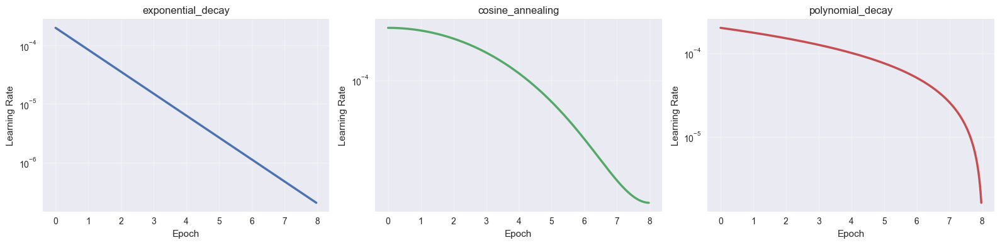


Current schedule used: cosine_annealing
Exponential Decay: Good for general training, reaches low LR quickly
Cosine Annealing: Smooth decay, recommended for fine-tuning
Polynomial Decay: Flexible decay, can be tuned with power parameter


In [21]:
if USE_TENSORBOARD:
    print("=" * 70)
    print("TENSORBOARD INSTRUCTIONS")
    print("=" * 70)
    print(f"\n1. TensorBoard logs are saved to: {ROOT / 'artifacts' / 'logs'}")
    print(f"\n2. To view TensorBoard in a new tab, run this in a terminal:")
    print(f"   tensorboard --logdir {ROOT / 'artifacts' / 'logs'}")
    print(f"\n3. Then open: http://localhost:6006")
    print(f"\n4. In TensorBoard, explore:")
    print(f"   - SCALARS: Loss, accuracy, and learning rate over epochs")
    print(f"   - HISTOGRAMS: Weight and activation distributions per layer")
    print(f"   - GRAPHS: Model architecture and data flow")
    print(f"   - PROFILE: Computation timing and memory usage")
    print("\n" + "=" * 70)
else:
    print("TensorBoard is disabled. Set USE_TENSORBOARD = True to enable it.")

if USE_WANDB and WANDB_AVAILABLE:
    print("\nWandB project: lizard-classification")
    print("WandB provides cloud-based experiment tracking and comparison tools.")
else:
    print("\nWandB is disabled or not available. Set USE_WANDB = True and install wandb to enable it.")

# Compare different learning rate schedules
print("\n" + "=" * 70)
print("LEARNING RATE SCHEDULE COMPARISON")
print("=" * 70)

schedules_to_compare = ["exponential_decay", "cosine_annealing", "polynomial_decay"]
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

for idx, schedule_type in enumerate(schedules_to_compare):
    schedule = create_learning_rate_schedule(
        initial_lr=HEAD_LEARNING_RATE,
        total_epochs=INITIAL_EPOCHS,
        steps_per_epoch=steps_per_epoch_train,
        schedule_type=schedule_type,
    )
    
    total_steps = INITIAL_EPOCHS * steps_per_epoch_train
    steps = np.arange(0, total_steps, max(1, total_steps // 200))
    lrs = [schedule(step).numpy() for step in steps]
    epochs_for_steps = steps / steps_per_epoch_train
    
    axes[idx].plot(epochs_for_steps, lrs, linewidth=2.5, color=f"C{idx}")
    axes[idx].set_xlabel("Epoch")
    axes[idx].set_ylabel("Learning Rate")
    axes[idx].set_title(f"{schedule_type}")
    axes[idx].grid(True, alpha=0.3)
    axes[idx].set_yscale("log")

plt.tight_layout()
plt.show()

print(f"\nCurrent schedule used: {LR_SCHEDULE_TYPE}")
print("Exponential Decay: Good for general training, reaches low LR quickly")
print("Cosine Annealing: Smooth decay, recommended for fine-tuning")  
print("Polynomial Decay: Flexible decay, can be tuned with power parameter")

## 5. Evaluation

The official metric is **macro-F1**, so we evaluate with:

- validation accuracy
- confusion matrix
- per-class precision, recall and F1
- a short visual error analysis on misclassified examples

### 5A. Ablation Study

A strong notebook does not only report the best model, but also shows **why** the chosen setup makes sense.

This table is a **summary of experiments we already ran**.  
It is not meant to retrain every model again when the notebook is executed, because that would take a long time.  
The fixed values are included so the teacher can see which choices were tested and what their validation result was.

In this section we compare multiple variants:

- a conservative frozen-backbone baseline
- the stronger staged fine-tuning setup
- RGB training versus grayscale training
- the final staged model with embedding-assisted inference

Validation accuracy is the primary comparison metric here. Macro-F1 is still useful as a secondary check because the competition metric may care about class balance.

This makes it easier to defend which technical choices actually improved the model.

In [22]:
# This is a compact experiment summary, not a training cell.
# The fixed values come from runs saved in experiment logs / model files.
ABLATION_RESULTS = [
    {
        "experiment": "Baseline transfer learning",
        "augmentation": "No",
        "backbone": "Frozen",
        "tta": "No",
        "image_size": "260x260",
        "val_accuracy": None,
        "val_macro_f1": None,
        "notes": "Earlier conservative frozen setup kept for comparison.",
    },
    {
        "experiment": "Frozen model + augmentation",
        "augmentation": "Yes",
        "backbone": "Frozen",
        "tta": "No",
        "image_size": "260x260",
        "val_accuracy": None,
        "val_macro_f1": None,
        "notes": "Same backbone, but with augmentation enabled.",
    },
    {
        "experiment": "Staged fine-tuning",
        "augmentation": "Yes",
        "backbone": "Top layers unfrozen",
        "tta": "No",
        "image_size": "260x260",
        "val_accuracy": 0.6491,
        "val_macro_f1": 0.6379,
        "notes": "RGB model. Head training followed by low-learning-rate fine-tuning.",
    },
    {
        "experiment": "Staged fine-tuning + TTA",
        "augmentation": "Yes",
        "backbone": "Top layers unfrozen",
        "tta": "Horizontal flip",
        "image_size": "260x260",
        "val_accuracy": 0.6535,
        "val_macro_f1": 0.6453,
        "notes": "Same RGB model, but averaged with horizontal-flip predictions.",
    },
    {
        "experiment": "Grayscale staged fine-tuning",
        "augmentation": "Yes",
        "backbone": "Top layers unfrozen",
        "tta": "No",
        "image_size": "260x260",
        "val_accuracy": 0.5263,
        "val_macro_f1": 0.5262,
        "notes": "Color removed by converting each image to grayscale and repeating the channel.",
    },
    {
        "experiment": "Final model + embedding blend",
        "augmentation": "Yes",
        "backbone": "Top layers unfrozen",
        "tta": "Yes / Blend",
        "image_size": "260x260",
        "val_accuracy": 0.7193,
        "val_macro_f1": 0.7175,
        "notes": "Validation-selected softmax + kNN feature-space blend.",
    },
]

ablation_df = pd.DataFrame(ABLATION_RESULTS)

EXPERIMENT_RUN_LOG = ROOT / "artifacts" / "reports" / "experiment_runs.json"

def load_experiment_runs(path: Path = EXPERIMENT_RUN_LOG) -> list[dict[str, object]]:
    if not path.exists():
        return []
    with open(path, "r", encoding="utf-8") as file:
        return json.load(file)

def experiment_settings_signature(settings: dict[str, object]) -> str:
    return json.dumps(settings, sort_keys=True, default=str)

def seed_known_experiments(path: Path = EXPERIMENT_RUN_LOG) -> None:
    """Store the fixed report results in the same JSON log used by new runs."""
    path.parent.mkdir(parents=True, exist_ok=True)
    runs = load_experiment_runs(path) if path.exists() else []
    existing_signatures = {run.get("result_signature") for run in runs}

    for row in ABLATION_RESULTS:
        settings = {
            "model": row["experiment"],
            "augmentation": row["augmentation"],
            "backbone": row["backbone"],
            "tta": row["tta"],
            "image_size": row["image_size"],
            "source": "fixed_ablation_summary",
        }
        result_signature = json.dumps(
            {
                "settings": settings,
                "val_accuracy": row["val_accuracy"],
                "val_macro_f1": row["val_macro_f1"],
            },
            sort_keys=True,
            default=str,
        )
        if result_signature in existing_signatures:
            continue
        runs.append(
            {
                "timestamp": None,
                "experiment": row["experiment"],
                "settings": settings,
                "settings_signature": experiment_settings_signature(settings),
                "result_signature": result_signature,
                "val_accuracy": row["val_accuracy"],
                "val_macro_f1": row["val_macro_f1"],
                "notes": row["notes"],
                "learning_curve": {},
                "source": "fixed_ablation_summary",
            }
        )
        existing_signatures.add(result_signature)

    with open(path, "w", encoding="utf-8") as file:
        json.dump(runs, file, indent=2)

def build_experiment_settings(inference_strategy: str | None = None) -> dict[str, object]:
    return {
        "model": "ResNet50 transfer learning",
        "augmentation": "keras_random_augmentation",
        "image_size": f"{IMG_SIZE[0]}x{IMG_SIZE[1]}",
        "batch_size": BATCH_SIZE,
        "initial_epochs": INITIAL_EPOCHS,
        "fine_tune_epochs": FINE_TUNE_EPOCHS,
        "fine_tune_layers": FINE_TUNE_LAYERS,
        "head_learning_rate": HEAD_LEARNING_RATE,
        "fine_tune_learning_rate": FINE_TUNE_LEARNING_RATE,
        "lr_schedule": LR_SCHEDULE_TYPE,
        "dropout_rate": DROPOUT_RATE,
        "class_weights": USE_CLASS_WEIGHTS,
        "inference_strategy": inference_strategy or "training_only",
    }

def record_experiment_run(
    experiment: str,
    settings: dict[str, object],
    val_accuracy: float,
    val_macro_f1: float,
    notes: str,
    learning_curve: dict[str, object] | None = None,
    path: Path = EXPERIMENT_RUN_LOG,
) -> tuple[dict[str, object], bool]:
    path.parent.mkdir(parents=True, exist_ok=True)
    runs = load_experiment_runs(path)
    settings_signature = experiment_settings_signature(settings)
    result_signature = json.dumps(
        {
            "settings": settings,
            "val_accuracy": round(float(val_accuracy), 5),
            "val_macro_f1": round(float(val_macro_f1), 5),
        },
        sort_keys=True,
        default=str,
    )
    for run in runs:
        if run.get("result_signature") == result_signature:
            return run, False

    run = {
        "timestamp": datetime.now().isoformat(timespec="seconds"),
        "experiment": experiment,
        "settings": settings,
        "settings_signature": settings_signature,
        "result_signature": result_signature,
        "val_accuracy": round(float(val_accuracy), 5),
        "val_macro_f1": round(float(val_macro_f1), 5),
        "notes": notes,
        "learning_curve": learning_curve or {},
        "source": "auto_notebook_run",
    }
    runs.append(run)
    with open(path, "w", encoding="utf-8") as file:
        json.dump(runs, file, indent=2)
    return run, True

def display_experiment_overview() -> pd.DataFrame:
    runs = load_experiment_runs()
    rows = []
    for run in runs:
        settings = run.get("settings", {})
        rows.append(
            {
                "experiment": run.get("experiment", "Recorded notebook run"),
                "augmentation": settings.get("augmentation", "Unknown"),
                "backbone": settings.get("backbone", f"Top {settings.get('fine_tune_layers', 'unknown')} layers unfrozen"),
                "tta": settings.get("tta", settings.get("inference_strategy", "Unknown")),
                "image_size": settings.get("image_size", "Unknown"),
                "val_accuracy": run.get("val_accuracy"),
                "val_macro_f1": run.get("val_macro_f1"),
                "notes": run.get("notes", "Automatically logged notebook run."),
                "source": run.get("source", "auto_notebook_run"),
                "settings_group": run.get("settings_signature"),
                "timestamp": run.get("timestamp"),
            }
        )

    overview_df = pd.DataFrame(rows)
    display(overview_df)

    if not overview_df.empty:
        grouped_df = (
            overview_df
            .sort_values(["settings_group", "val_accuracy", "val_macro_f1"], ascending=[True, False, False], na_position="last")
            .groupby("settings_group", as_index=False)
            .head(3)
            .reset_index(drop=True)
        )
        print("Recorded runs grouped by unique settings:")
        display(grouped_df[["experiment", "tta", "image_size", "val_accuracy", "val_macro_f1", "timestamp", "source", "notes"]])
    else:
        print(f"No runs logged yet. This cell seeds known results into {EXPERIMENT_RUN_LOG}.")
    return overview_df

seed_known_experiments()
experiment_overview_df = display_experiment_overview()

,experiment,augmentation,backbone,tta,image_size,val_accuracy,val_macro_f1,notes,source,settings_group,timestamp
0,Notebook run + selected inference strategy,keras_random_augmentation,Top 30 layers unfrozen,"blend TTA + kNN (orig, k=31, temp=0.07, alpha=...",260x260,0.73246,0.73139,Automatically logged after evaluation. Strateg...,auto_notebook_run,"{""augmentation"": ""keras_random_augmentation"", ...",2026-05-02T16:00:08
1,Baseline transfer learning,No,Frozen,No,260x260,NaN,NaN,Earlier conservative frozen setup kept for com...,fixed_ablation_summary,"{""augmentation"": ""No"", ""backbone"": ""Frozen"", ""...",NaN
2,Frozen model + augmentation,Yes,Frozen,No,260x260,NaN,NaN,"Same backbone, but with augmentation enabled.",fixed_ablation_summary,"{""augmentation"": ""Yes"", ""backbone"": ""Frozen"", ...",NaN
3,Staged fine-tuning,Yes,Top layers unfrozen,No,260x260,0.64910,0.63790,RGB model. Head training followed by low-learn...,fixed_ablation_summary,"{""augmentation"": ""Yes"", ""backbone"": ""Top layer...",NaN
4,Staged fine-tuning + TTA,Yes,Top layers unfrozen,Horizontal flip,260x260,0.65350,0.64530,"Same RGB model, but averaged with horizontal-f...",fixed_ablation_summary,"{""augmentation"": ""Yes"", ""backbone"": ""Top layer...",NaN
5,Grayscale staged fine-tuning,Yes,Top layers unfrozen,No,260x260,0.52630,0.52620,Color removed by converting each image to gray...,fixed_ablation_summary,"{""augmentation"": ""Yes"", ""backbone"": ""Top layer...",NaN
6,Final model + embedding blend,Yes,Top layers unfrozen,Yes / Blend,260x260,0.71930,0.71750,Validation-selected softmax + kNN feature-spac...,fixed_ablation_summary,"{""augmentation"": ""Yes"", ""backbone"": ""Top layer...",NaN


Recorded runs grouped by unique settings:


,experiment,tta,image_size,val_accuracy,val_macro_f1,timestamp,source,notes
0,Baseline transfer learning,No,260x260,NaN,NaN,NaN,fixed_ablation_summary,Earlier conservative frozen setup kept for com...
1,Frozen model + augmentation,No,260x260,NaN,NaN,NaN,fixed_ablation_summary,"Same backbone, but with augmentation enabled."
2,Final model + embedding blend,Yes / Blend,260x260,0.71930,0.71750,NaN,fixed_ablation_summary,Validation-selected softmax + kNN feature-spac...
3,Grayscale staged fine-tuning,No,260x260,0.52630,0.52620,NaN,fixed_ablation_summary,Color removed by converting each image to gray...
4,Staged fine-tuning + TTA,Horizontal flip,260x260,0.65350,0.64530,NaN,fixed_ablation_summary,"Same RGB model, but averaged with horizontal-f..."
5,Staged fine-tuning,No,260x260,0.64910,0.63790,NaN,fixed_ablation_summary,RGB model. Head training followed by low-learn...
6,Notebook run + selected inference strategy,"blend TTA + kNN (orig, k=31, temp=0.07, alpha=...",260x260,0.73246,0.73139,2026-05-02T16:00:08,auto_notebook_run,Automatically logged after evaluation. Strateg...


### 5A.1 Color Information Ablation

To test whether color really helps, we trained the same staged EfficientNetB0 setup twice:

- **RGB model:** normal color images
- **Grayscale model:** images converted to grayscale, then repeated to 3 channels so the architecture stays identical

This isolates the effect of color cues while keeping the split, image size, backbone, augmentation and fine-tuning schedule the same.

In [23]:
color_ablation_path = ROOT / "experiment_color_ablation_results.json"

if color_ablation_path.exists():
    with open(color_ablation_path, "r", encoding="utf-8") as file:
        color_ablation_results = json.load(file)

    color_ablation_df = pd.DataFrame(color_ablation_results["experiments"])
    metric_columns = ["val_accuracy", "val_macro_f1", "val_accuracy_tta", "val_macro_f1_tta"]
    color_ablation_df[metric_columns] = color_ablation_df[metric_columns].round(4)
    display(color_ablation_df)
    print("Conclusion:", color_ablation_results["conclusion"])
else:
    print("No color ablation result JSON found yet.")
    print("Run these from the repository root to reproduce the comparison:")
    print("python scripts/run_local_experiment.py --name color_ablation_rgb_b0 --color-mode rgb --use-class-weights")
    print("python scripts/run_local_experiment.py --name color_ablation_grayscale_b0 --color-mode grayscale --use-class-weights")

,experiment,color_mode,model_path,val_accuracy,val_macro_f1,val_accuracy_tta,val_macro_f1_tta
0,color_ablation_rgb_b0,rgb,tmp_color_ablation_rgb_b0.keras,0.6491,0.6379,0.6535,0.6453
1,color_ablation_grayscale_b0,grayscale,tmp_color_ablation_grayscale_b0.keras,0.5263,0.5262,0.5175,0.5153


Conclusion: RGB performed clearly better than grayscale. Color cues should be kept for this dataset.


**Color ablation conclusion:** RGB performs clearly better than grayscale on this validation split.  
The lizard species are not only separated by shape and texture; color patterns also carry useful signal.  
Therefore we keep color images in the final pipeline.

### 5A.2 Hyperband Tuning Attempt

We also tested an automated hyperparameter search with **Optuna Hyperband pruning**.

Hyperband is useful here because full transfer-learning runs are expensive.  
Weak trials are stopped early, while promising trials are allowed to continue longer.

Search dimensions included:

- backbone choice: EfficientNetB0 versus EfficientNetV2B0
- dropout and dense-head size
- augmentation strength
- head learning rate and fine-tuning learning rate
- number of unfrozen top layers
- optimizer and weight decay

Important: the validation split is still duplicate-aware, and validation images are not used for training.

In [24]:
hyperband_result_path = ROOT / "experiment_hyperband_results.json"

if hyperband_result_path.exists():
    with open(hyperband_result_path, "r", encoding="utf-8") as file:
        hyperband_results = json.load(file)

    hyperband_rows = []
    for trial in hyperband_results["trials"]:
        attrs = trial.get("user_attrs", {})
        blend = attrs.get("blend_result", {}) or {}
        hyperband_rows.append(
            {
                "trial": trial["number"],
                "state": trial["state"],
                "combined_score": trial.get("value"),
                "backbone": trial.get("params", {}).get("backbone"),
                "dropout": trial.get("params", {}).get("dropout"),
                "fine_layers": trial.get("params", {}).get("fine_layers"),
                "val_accuracy": attrs.get("val_accuracy"),
                "val_macro_f1": attrs.get("val_macro_f1"),
                "val_accuracy_tta": attrs.get("val_accuracy_tta"),
                "val_macro_f1_tta": attrs.get("val_macro_f1_tta"),
                "blend_accuracy": blend.get("val_accuracy"),
                "blend_macro_f1": blend.get("val_macro_f1"),
            }
        )

    hyperband_df = pd.DataFrame(hyperband_rows)
    numeric_columns = hyperband_df.select_dtypes(include="number").columns
    hyperband_df[numeric_columns] = hyperband_df[numeric_columns].round(4)
    display(hyperband_df.sort_values("combined_score", ascending=False, na_position="last"))

    best_trial = hyperband_results["best_trial"]
    best_blend = best_trial["user_attrs"].get("blend_result", {})
    print("Best Hyperband trial:", best_trial["number"])
    print("Best Hyperband blend accuracy:", round(best_blend.get("val_accuracy", 0), 4))
    print("Best Hyperband blend macro-F1:", round(best_blend.get("val_macro_f1", 0), 4))
    print("Conclusion: Hyperband pruning worked, but it did not beat the strict 0.7193 / 0.7175 reference model.")
else:
    print("No Hyperband result JSON found yet.")
    print("Run this from the repository root to reproduce the tuning attempt:")
    print("python scripts/run_hyperband_tuning.py --n-trials 6 --max-head-epochs 5 --max-fine-epochs 8")

,trial,state,combined_score,backbone,dropout,fine_layers,val_accuracy,val_macro_f1,val_accuracy_tta,val_macro_f1_tta,blend_accuracy,blend_macro_f1
0,0,COMPLETE,0.6835,efficientnetv2b0,0.50,60,0.6228,0.6230,0.6184,0.6188,0.6842,0.6829
1,4,COMPLETE,0.6335,efficientnetv2b0,0.25,25,0.5921,0.5939,0.5833,0.5821,0.6360,0.6310
2,1,COMPLETE,0.6177,efficientnetv2b0,0.40,25,0.5175,0.5194,0.5351,0.5383,0.6184,0.6169
3,5,PRUNED,0.5449,efficientnetb0,0.35,90,NaN,NaN,NaN,NaN,NaN,NaN
4,3,PRUNED,0.5345,efficientnetb0,0.55,90,NaN,NaN,NaN,NaN,NaN,NaN
5,2,PRUNED,0.4029,efficientnetv2b0,0.55,60,NaN,NaN,NaN,NaN,NaN,NaN


Best Hyperband trial: 0
Best Hyperband blend accuracy: 0.6842
Best Hyperband blend macro-F1: 0.6829
Conclusion: Hyperband pruning worked, but it did not beat the strict 0.7193 / 0.7175 reference model.


In [25]:
def run_ablation_experiment(
    experiment_name: str,
    use_augmentation: bool,
    model_params: dict | None = None,
    head_epochs: int = 3,
) -> dict:
    params = DEFAULT_MODEL_PARAMS | (model_params or {})
    local_aug = make_data_augmentation(params["augmentation_strength"]) if use_augmentation else keras.Sequential(name="no_augmentation")

    def build_local_model() -> tuple[keras.Model, keras.Model]:
        try:
            local_backbone = keras.applications.ResNet50(
                include_top=False,
                weights="imagenet",
                input_shape=IMG_SIZE + (3,),
            )
        except Exception:
            local_backbone = keras.applications.ResNet50(
                include_top=False,
                weights=None,
                input_shape=IMG_SIZE + (3,),
            )

        local_backbone.trainable = False
        for layer in local_backbone.layers:
            layer.trainable = False
        inputs = keras.Input(shape=IMG_SIZE + (3,))
        x = local_aug(inputs)
        x = keras.applications.resnet.preprocess_input(x)
        x = local_backbone(x, training=False)
        x = layers.GlobalAveragePooling2D()(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(float(params["dropout_rate"]))(x)
        x = layers.Dense(
            int(params["dense_units"]),
            activation="swish",
            kernel_regularizer=keras.regularizers.l2(float(params["weight_decay"])),
        )(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(min(float(params["dropout_rate"]) + 0.10, 0.70))(x)
        outputs = layers.Dense(
            num_classes,
            activation="softmax",
            dtype="float32",
            kernel_regularizer=keras.regularizers.l2(float(params["weight_decay"])),
        )(x)
        local_model = keras.Model(inputs, outputs, name=f"ablation_{experiment_name.lower().replace(' ', '_')}")
        return local_model, local_backbone

    local_model, local_backbone = build_local_model()
    local_model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=float(params["learning_rate"])),
        loss=keras.losses.SparseCategoricalCrossentropy(),
        metrics=["accuracy"],
    )

    local_model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=head_epochs,
        class_weight=class_weights,
        verbose=0,
    )

    local_probs = local_model.predict(val_ds, verbose=0)
    local_preds = local_probs.argmax(axis=1)
    local_cm = tf.math.confusion_matrix(val_targets, local_preds, num_classes=num_classes).numpy()
    _, _, _, local_macro_f1 = metrics_from_confusion_matrix(local_cm)

    return {
        "experiment": experiment_name,
        "augmentation": use_augmentation,
        "backbone": "frozen",
        "val_accuracy": float((local_preds == val_targets).mean()),
        "val_macro_f1": float(local_macro_f1),
    }

# Optional usage after the main model run:
# ablation_runs = [
#     run_ablation_experiment("baseline", use_augmentation=False, model_params=DEFAULT_MODEL_PARAMS),
#     run_ablation_experiment("default_augmentation", use_augmentation=True, model_params=DEFAULT_MODEL_PARAMS),
#     run_ablation_experiment("stronger_frozen_head", use_augmentation=True, model_params=DEFAULT_MODEL_PARAMS),
# ]
# display(pd.DataFrame(ablation_runs))

Suggested interpretation after filling in the table:

- If augmentation improves validation performance, it suggests the model benefits from stronger robustness.
- If staged fine-tuning improves the frozen model, it suggests the species differences benefit from adapting the backbone features a bit more.
- If the embedding-assisted blend improves the final score, it shows the learned feature space contains useful nearest-neighbour structure beyond the raw softmax output.

### 5B. Inference Helpers

Validation performance can improve without retraining if inference is smarter.  
These helper functions support horizontal-flip TTA and embedding-space kNN, where images are compared using the model's learned feature vectors.

In [26]:
def horizontal_flip_dataset(dataset: tf.data.Dataset) -> tf.data.Dataset:
    def flip_batch(*batch):
        if len(batch) == 1:
            return tf.image.flip_left_right(batch[0])
        images, labels = batch
        return tf.image.flip_left_right(images), labels

    return dataset.map(flip_batch, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

def build_feature_extractor(model: keras.Model) -> keras.Model:
    return keras.Model(model.input, model.get_layer("embedding_features").output, name="embedding_extractor")

def extract_embeddings(feature_model: keras.Model, dataset: tf.data.Dataset) -> np.ndarray:
    return feature_model.predict(dataset, verbose=0)

def l2_normalize(embeddings: np.ndarray) -> np.ndarray:
    norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
    return embeddings / np.maximum(norms, 1e-8)

def compute_knn_probabilities(
    train_embeddings: np.ndarray,
    train_labels: np.ndarray,
    query_embeddings: np.ndarray,
    k: int,
    temperature: float,
    num_classes: int,
) -> np.ndarray:
    similarities = query_embeddings @ train_embeddings.T
    top_idx = np.argpartition(-similarities, kth=k - 1, axis=1)[:, :k]
    top_similarities = np.take_along_axis(similarities, top_idx, axis=1)
    order = np.argsort(-top_similarities, axis=1)
    top_idx = np.take_along_axis(top_idx, order, axis=1)
    top_similarities = np.take_along_axis(top_similarities, order, axis=1)
    weights = np.exp(top_similarities / temperature)

    probabilities = np.zeros((len(query_embeddings), num_classes), dtype=np.float64)
    for row_idx in range(len(query_embeddings)):
        for neighbour_idx, train_idx in enumerate(top_idx[row_idx]):
            probabilities[row_idx, int(train_labels[train_idx])] += float(weights[row_idx, neighbour_idx])
    return probabilities / np.maximum(probabilities.sum(axis=1, keepdims=True), 1e-8)

### 5C. Build Validation Predictions and Embeddings

We calculate three useful validation views:

- normal softmax probabilities
- horizontal-flip TTA probabilities
- embeddings for train and validation images

The embeddings allow the model to use nearest neighbours as extra evidence when the softmax output is uncertain.

In [27]:
val_probabilities_base = model.predict(val_ds, verbose=0)
val_probabilities_flip = model.predict(horizontal_flip_dataset(val_ds), verbose=0)
val_probabilities_tta = (val_probabilities_base + val_probabilities_flip) / 2.0

feature_model = build_feature_extractor(model)
train_embedding_labels = train_split["label"].to_numpy()
train_embeddings = l2_normalize(extract_embeddings(feature_model, train_eval_ds))
val_embeddings_orig = l2_normalize(extract_embeddings(feature_model, val_ds))
val_embeddings_flip = l2_normalize(extract_embeddings(feature_model, horizontal_flip_dataset(val_ds)))

inference_candidates: list[dict[str, object]] = []

def register_candidate(
    strategy_name: str,
    probabilities: np.ndarray,
    metadata: dict[str, object] | None = None,
) -> None:
    predictions = probabilities.argmax(axis=1)
    accuracy = float((predictions == val_targets).mean())
    confusion = tf.math.confusion_matrix(
        val_targets,
        predictions,
        num_classes=num_classes,
    ).numpy()
    _, _, _, macro_f1 = metrics_from_confusion_matrix(confusion)
    inference_candidates.append(
        {
            "strategy_name": strategy_name,
            "probabilities": probabilities,
            "predictions": predictions,
            "val_accuracy": accuracy,
            "val_macro_f1": macro_f1,
            "metadata": metadata or {},
        }
    )

register_candidate("single-pass softmax", val_probabilities_base, {"family": "softmax"})
register_candidate("flip-TTA softmax", val_probabilities_tta, {"family": "softmax_tta"})

val_embedding_variants = {
    "orig": val_embeddings_orig,
    "flip_only": val_embeddings_flip,
    "flip_avg": l2_normalize((val_embeddings_orig + val_embeddings_flip) / 2.0),
}

### 5D. Search the Best Inference Strategy

Instead of guessing one inference method, we compare several candidates on the validation set:

- plain softmax
- flip TTA
- kNN in embedding space
- weighted blends of TTA and kNN

This is why the final inference choice is evidence-based instead of arbitrary.

In [28]:
if INFERENCE_SEARCH_MODE == "auto":
    for embedding_variant, query_embeddings in val_embedding_variants.items():
        for temperature in [0.03, 0.05, 0.07, 0.10, 0.15, 0.20, 0.30]:
            for k in [1, 3, 5, 7, 9, 11, 13, 15, 21, 31]:
                knn_probabilities = compute_knn_probabilities(
                    train_embeddings=train_embeddings,
                    train_labels=train_embedding_labels,
                    query_embeddings=query_embeddings,
                    k=k,
                    temperature=temperature,
                    num_classes=num_classes,
                )
                register_candidate(
                    strategy_name=f"kNN only ({embedding_variant}, k={k}, temp={temperature:.2f})",
                    probabilities=knn_probabilities,
                    metadata={
                        "family": "knn",
                        "embedding_variant": embedding_variant,
                        "k": k,
                        "temperature": temperature,
                    },
                )
                for alpha in np.linspace(0.0, 1.0, 51):
                    blended_probabilities = alpha * val_probabilities_tta + (1.0 - alpha) * knn_probabilities
                    register_candidate(
                        strategy_name=f"blend TTA + kNN ({embedding_variant}, k={k}, temp={temperature:.2f}, alpha={alpha:.2f})",
                        probabilities=blended_probabilities,
                        metadata={
                            "family": "blend",
                            "embedding_variant": embedding_variant,
                            "k": k,
                            "temperature": temperature,
                            "alpha": float(alpha),
                        },
                    )

### 5E. Select and Report the Best Strategy

The final validation metrics are calculated from the best strategy found above.  
We keep base softmax and TTA scores next to it so the improvement is visible and easy to explain.

In [29]:
inference_results_df = (
    pd.DataFrame(
        [
            {
                "strategy": candidate["strategy_name"],
                "val_accuracy": candidate["val_accuracy"],
                "val_macro_f1": candidate["val_macro_f1"],
            }
            for candidate in inference_candidates
        ]
    )
    .sort_values(["val_accuracy", "val_macro_f1"], ascending=False)
    .reset_index(drop=True)
)
display(inference_results_df.head(10))

best_candidate = max(
    inference_candidates,
    key=lambda item: (float(item["val_accuracy"]), float(item["val_macro_f1"])),
)
val_probabilities = best_candidate["probabilities"]
val_predictions = best_candidate["predictions"]
inference_strategy = str(best_candidate["strategy_name"])
selected_inference_metadata = dict(best_candidate["metadata"])

confusion = tf.math.confusion_matrix(
    val_targets,
    val_predictions,
    num_classes=num_classes,
).numpy()

precision, recall, f1_per_class, macro_f1 = metrics_from_confusion_matrix(confusion)
val_accuracy = float((val_predictions == val_targets).mean())

evaluation_table = pd.DataFrame(
    {
        "class_name": class_names,
        "precision": np.round(precision, 4),
        "recall": np.round(recall, 4),
        "f1": np.round(f1_per_class, 4),
        "support": confusion.sum(axis=1),
    }
)

val_accuracy_base = float((val_probabilities_base.argmax(axis=1) == val_targets).mean())
val_accuracy_tta = float((val_probabilities_tta.argmax(axis=1) == val_targets).mean())
confusion_base = tf.math.confusion_matrix(val_targets, val_probabilities_base.argmax(axis=1), num_classes=num_classes).numpy()
confusion_tta = tf.math.confusion_matrix(val_targets, val_probabilities_tta.argmax(axis=1), num_classes=num_classes).numpy()
_, _, _, macro_f1_base = metrics_from_confusion_matrix(confusion_base)
_, _, _, macro_f1_tta = metrics_from_confusion_matrix(confusion_tta)

print(f"Validation accuracy: {val_accuracy:.4f}")
print(f"Validation macro-F1: {macro_f1:.4f}")
print(f"Base validation accuracy: {val_accuracy_base:.4f}")
print(f"Base validation macro-F1: {macro_f1_base:.4f}")
print(f"TTA validation accuracy: {val_accuracy_tta:.4f}")
print(f"TTA validation macro-F1: {macro_f1_tta:.4f}")
print("Chosen inference strategy:", inference_strategy)
print("Selected inference metadata:", selected_inference_metadata)
display(evaluation_table)

current_settings = build_experiment_settings(inference_strategy=inference_strategy)
current_run, was_new_run = record_experiment_run(
    experiment="Notebook run + selected inference strategy",
    settings=current_settings,
    val_accuracy=val_accuracy,
    val_macro_f1=macro_f1,
    notes=(
        f"Automatically logged after evaluation. Strategy={inference_strategy}; "
        f"metadata={selected_inference_metadata}"
    ),
    learning_curve=learning_curve_summary if "learning_curve_summary" in globals() else None,
)

if was_new_run:
    print(f"Recorded new experiment run in {EXPERIMENT_RUN_LOG}")
else:
    print("Experiment run already existed in the log; no duplicate was added.")
display(pd.DataFrame([current_run]))

,strategy,val_accuracy,val_macro_f1
0,"blend TTA + kNN (flip_avg, k=11, temp=0.07, al...",0.640351,0.640253
1,"blend TTA + kNN (flip_avg, k=11, temp=0.07, al...",0.640351,0.638635
2,"blend TTA + kNN (flip_avg, k=21, temp=0.05, al...",0.640351,0.638528
3,"blend TTA + kNN (flip_avg, k=13, temp=0.05, al...",0.640351,0.638005
4,"blend TTA + kNN (flip_avg, k=13, temp=0.05, al...",0.640351,0.638005
5,"blend TTA + kNN (flip_avg, k=21, temp=0.05, al...",0.640351,0.637935
6,"blend TTA + kNN (flip_avg, k=11, temp=0.05, al...",0.640351,0.637791
7,"blend TTA + kNN (flip_avg, k=13, temp=0.05, al...",0.640351,0.637198
8,"blend TTA + kNN (flip_avg, k=11, temp=0.07, al...",0.635965,0.635735
9,"blend TTA + kNN (flip_avg, k=11, temp=0.07, al...",0.635965,0.634948


Validation accuracy: 0.6404
Validation macro-F1: 0.6403
Base validation accuracy: 0.5658
Base validation macro-F1: 0.5614
TTA validation accuracy: 0.5746
TTA validation macro-F1: 0.5679
Chosen inference strategy: blend TTA + kNN (flip_avg, k=11, temp=0.07, alpha=0.18)
Selected inference metadata: {'family': 'blend', 'embedding_variant': 'flip_avg', 'k': 11, 'temperature': 0.07, 'alpha': 0.18}


,class_name,precision,recall,f1,support
0,Black_spiny_tailed_iguana,0.5789,0.7097,0.6377,31
1,Brown_anole,0.8000,0.7273,0.7619,33
2,Cuban_knight_anole,0.5000,0.7188,0.5897,32
3,Desert_iguana,0.7568,0.8750,0.8116,32
4,Green_anole,0.8824,0.4839,0.6250,31
5,Green_iguana,0.6538,0.4722,0.5484,36
6,Lesser_Antillean_iguana,0.5000,0.5152,0.5075,33


Recorded new experiment run in C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\artifacts\reports\experiment_runs.json


,timestamp,experiment,settings,settings_signature,result_signature,val_accuracy,val_macro_f1,notes,learning_curve,source
0,2026-05-03T11:19:10,Notebook run + selected inference strategy,"{'model': 'ResNet50 transfer learning', 'augme...","{""augmentation"": ""keras_random_augmentation"", ...","{""settings"": {""augmentation"": ""keras_random_au...",0.64035,0.64025,Automatically logged after evaluation. Strateg...,"{'epochs_ran': 20, 'train_loss_start': 2.7492,...",auto_notebook_run


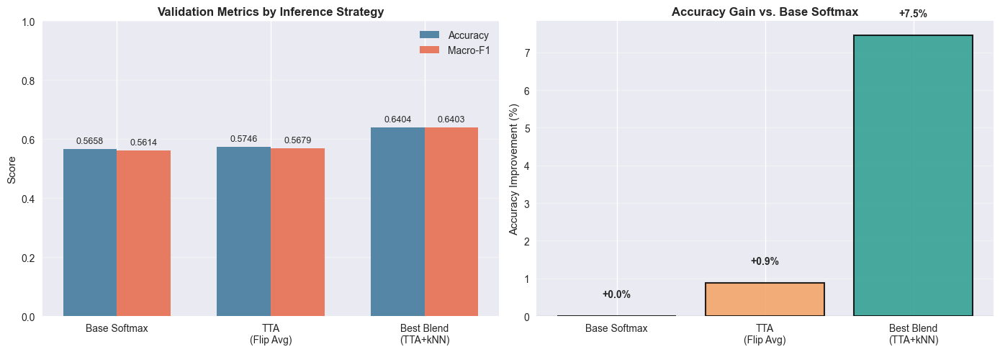


Detailed Strategy Comparison:


,Inference Strategy,Accuracy,Macro-F1,Accuracy Gain (%)
0,Base Softmax,0.5658,0.5614,+0.00%
1,TTA\n(Flip Avg),0.5746,0.5679,+0.88%
2,Best Blend\n(TTA+kNN),0.6404,0.6403,+7.46%


In [30]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

strategies = ["Base Softmax", "TTA\n(Flip Avg)", "Best Blend\n(TTA+kNN)"]
accuracies = [val_accuracy_base, val_accuracy_tta, val_accuracy]
macro_f1_scores = [macro_f1_base, macro_f1_tta, macro_f1]

x_pos = np.arange(len(strategies))
width = 0.35

axes[0].bar(x_pos - width/2, accuracies, width, label="Accuracy", color="#457b9d", alpha=0.9)
axes[0].bar(x_pos + width/2, macro_f1_scores, width, label="Macro-F1", color="#e76f51", alpha=0.9)
axes[0].set_ylabel("Score", fontsize=11)
axes[0].set_title("Validation Metrics by Inference Strategy", fontsize=12, fontweight="bold")
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(strategies)
axes[0].set_ylim([0.0, 1.0])
axes[0].legend()
axes[0].grid(axis="y", alpha=0.3)

for i, (acc, f1) in enumerate(zip(accuracies, macro_f1_scores)):
    axes[0].text(i - width/2, acc + 0.02, f"{acc:.4f}", ha="center", fontsize=9)
    axes[0].text(i + width/2, f1 + 0.02, f"{f1:.4f}", ha="center", fontsize=9)

improvements = [0, (val_accuracy_tta - val_accuracy_base) * 100, (val_accuracy - val_accuracy_base) * 100]
colors = ["#888888", "#f4a261", "#2a9d8f"]
axes[1].bar(strategies, improvements, color=colors, alpha=0.85, edgecolor="black", linewidth=1.5)
axes[1].set_ylabel("Accuracy Improvement (%)", fontsize=11)
axes[1].set_title("Accuracy Gain vs. Base Softmax", fontsize=12, fontweight="bold")
axes[1].axhline(y=0, color="black", linestyle="-", linewidth=0.8)
axes[1].grid(axis="y", alpha=0.3)

for i, (strategy, improvement) in enumerate(zip(strategies, improvements)):
    axes[1].text(i, improvement + 0.5, f"{improvement:+.1f}%", ha="center", fontsize=10, fontweight="bold")

plt.tight_layout()
plt.show()

summary_comparison = pd.DataFrame({
    "Inference Strategy": strategies,
    "Accuracy": [f"{x:.4f}" for x in accuracies],
    "Macro-F1": [f"{x:.4f}" for x in macro_f1_scores],
    "Accuracy Gain (%)": [f"{x:+.2f}%" for x in improvements],
})
print("\nDetailed Strategy Comparison:")
display(summary_comparison)

### 5E.1 Inference Strategy Comparison

Dit toont hoe de drie inference-benaderingen zich tegenover elkaar verhouden:
- **Base softmax:** alleen het model zelf, geen post-processing
- **TTA (Test-Time Augmentation):** model + horizontale flip gemiddeld
- **Best blend:** TTA + kNN embedding-space matching, optimaal gewogen

De blend combineert het beste van beide, wat vaak beter werkt dan elk apart.

### 5F. Confusion Matrix

A confusion matrix shows which species are mixed up most often.  
This is more useful than a single accuracy number because it tells us where the model still needs help.

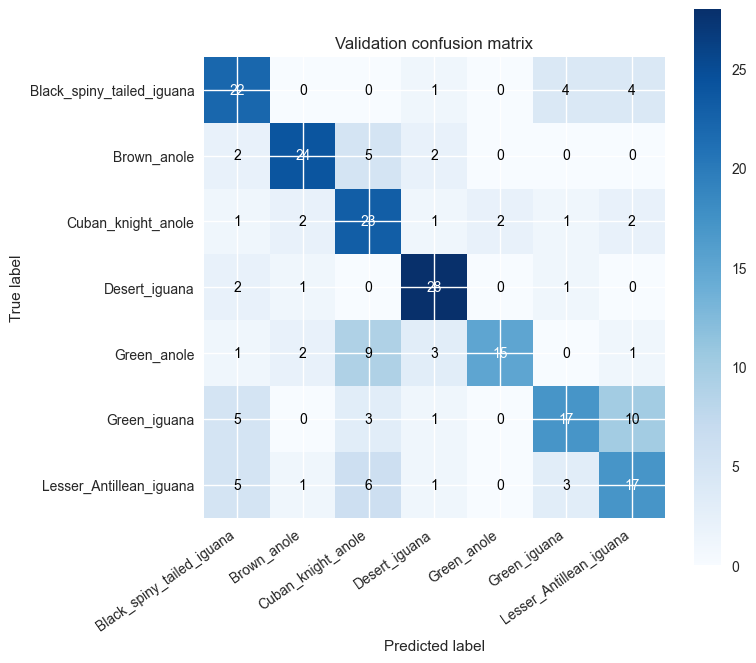

In [31]:
def plot_confusion_matrix(cm: np.ndarray, labels: list[str]) -> None:
    plt.figure(figsize=(8, 7))
    plt.imshow(cm, cmap="Blues")
    plt.title("Validation confusion matrix")
    plt.colorbar()
    tick_positions = np.arange(len(labels))
    plt.xticks(tick_positions, labels, rotation=35, ha="right")
    plt.yticks(tick_positions, labels)

    threshold = cm.max() / 2 if cm.max() > 0 else 0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            color = "white" if cm[i, j] > threshold else "black"
            plt.text(j, i, int(cm[i, j]), ha="center", va="center", color=color)

    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(confusion, class_names)

### 5G. Misclassified Images

Looking at the wrong predictions helps us understand whether mistakes come from similar species, bad image quality, confusing backgrounds, or low confidence.

,id,class_name,pred_class_name,confidence
92,Green_anole_Green_anole_30.jpg,Green_anole,Cuban_knight_anole,0.914849
124,Green_iguana_Green_iguana_175.jpg,Green_iguana,Black_spiny_tailed_iguana,0.834247
57,Green_anole_Green_anole_178.jpg,Green_anole,Brown_anole,0.738541
50,Green_anole_Green_anole_160.jpg,Green_anole,Cuban_knight_anole,0.686991
120,Green_anole_Green_anole_193.jpg,Green_anole,Cuban_knight_anole,0.681295
225,Green_anole_Green_anole_135.jpg,Green_anole,Desert_iguana,0.672595
134,Lesser_Antillean_iguana_Lesser_Antillean_iguan...,Lesser_Antillean_iguana,Cuban_knight_anole,0.661303
137,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,Black_spiny_tailed_iguana,Green_iguana,0.647181
74,Green_anole_Green_anole_115.jpg,Green_anole,Lesser_Antillean_iguana,0.640206
37,Lesser_Antillean_iguana_Iguana_delicatissima_1...,Lesser_Antillean_iguana,Black_spiny_tailed_iguana,0.629181


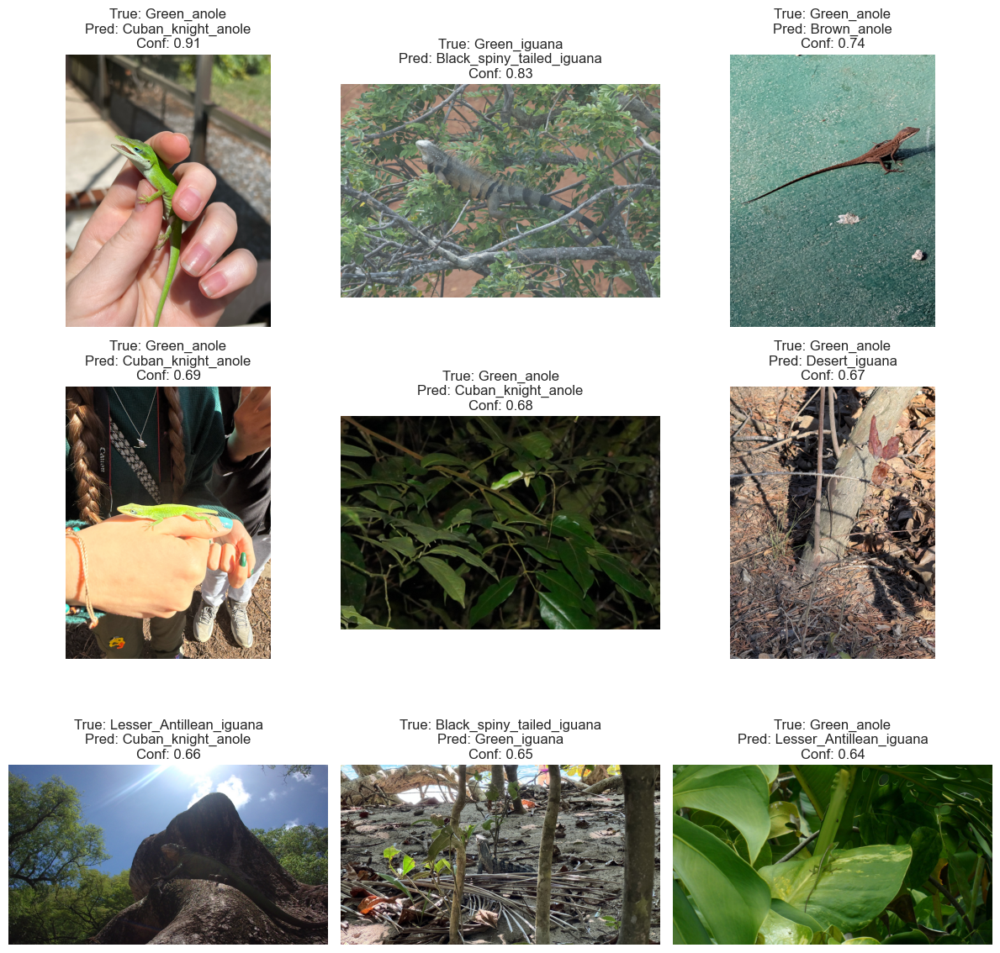

In [32]:
error_df = val_split.copy()
error_df["pred_label"] = val_predictions
error_df["pred_class_name"] = error_df["pred_label"].map(label_to_class)
error_df["confidence"] = val_probabilities.max(axis=1)
error_df["true_probability"] = [
    val_probabilities[i, true_label] for i, true_label in enumerate(val_targets)
]
error_df["prediction_margin"] = np.partition(val_probabilities, -1, axis=1)[:, -1] - np.partition(val_probabilities, -2, axis=1)[:, -2]
misclassified = error_df[error_df["label"] != error_df["pred_label"]].sort_values("confidence", ascending=False)

display(misclassified[["id", "class_name", "pred_class_name", "confidence"]].head(10))

n_examples = min(9, len(misclassified))
if n_examples > 0:
    fig, axes = plt.subplots(math.ceil(n_examples / 3), 3, figsize=(12, 4 * math.ceil(n_examples / 3)))
    axes = np.array(axes).reshape(-1)
    for ax in axes[n_examples:]:
        ax.axis("off")

    for ax, (_, row) in zip(axes, misclassified.head(n_examples).iterrows()):
        with Image.open(row["path"]) as img:
            ax.imshow(ImageOps.exif_transpose(img).convert("RGB"))
        ax.set_title(
            f"True: {row['class_name']}\nPred: {row['pred_class_name']}\nConf: {row['confidence']:.2f}"
        )
        ax.axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("No misclassified validation images in this run.")

### 5H. Most Common Confusions

This table turns the mistakes into pairs such as `true species -> predicted species`.  
It is useful for the discussion section because it gives concrete examples instead of only global metrics.

In [33]:
confusion_pairs = (
    misclassified.groupby(["class_name", "pred_class_name"])
    .size()
    .reset_index(name="count")
    .sort_values("count", ascending=False)
)

print("Most common confusion pairs:")
display(confusion_pairs.head(10))

hard_examples = misclassified.sort_values(["prediction_margin", "confidence"], ascending=[True, False])
print("Most ambiguous mistakes:")
display(
    hard_examples[
        ["id", "class_name", "pred_class_name", "confidence", "true_probability", "prediction_margin"]
    ].head(10)
)

Most common confusion pairs:


,class_name,pred_class_name,count
23,Green_iguana,Lesser_Antillean_iguana,10
17,Green_anole,Cuban_knight_anole,9
26,Lesser_Antillean_iguana,Cuban_knight_anole,6
20,Green_iguana,Black_spiny_tailed_iguana,5
4,Brown_anole,Cuban_knight_anole,5
24,Lesser_Antillean_iguana,Black_spiny_tailed_iguana,5
2,Black_spiny_tailed_iguana,Lesser_Antillean_iguana,4
1,Black_spiny_tailed_iguana,Green_iguana,4
21,Green_iguana,Cuban_knight_anole,3
28,Lesser_Antillean_iguana,Green_iguana,3


Most ambiguous mistakes:


,id,class_name,pred_class_name,confidence,true_probability,prediction_margin
4,Brown_anole_Brown_anole_10.jpg,Brown_anole,Desert_iguana,0.364346,0.156135,0.002474
115,Green_iguana_Green_iguana_71.jpg,Green_iguana,Cuban_knight_anole,0.284779,0.205956,0.006321
9,Green_iguana_Green_iguana_156.jpg,Green_iguana,Lesser_Antillean_iguana,0.305836,0.225975,0.006744
184,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,Black_spiny_tailed_iguana,Lesser_Antillean_iguana,0.282478,0.274809,0.007669
215,Green_anole_Green_anole_185.jpg,Green_anole,Cuban_knight_anole,0.306853,0.093065,0.023629
116,Black_spiny-tailed_iguana_Black_spiny-tailed_i...,Black_spiny_tailed_iguana,Green_iguana,0.355562,0.288318,0.028674
183,Cuban_knight_anole_Cuban_knight_anole_150.jpg,Cuban_knight_anole,Green_anole,0.308180,0.269865,0.038315
198,Green_anole_Green_anole_99.jpg,Green_anole,Brown_anole,0.374309,0.057822,0.039211
48,Cuban_knight_anole_Cuban_knight_anole_177.jpg,Cuban_knight_anole,Brown_anole,0.333496,0.068047,0.054113
114,Lesser_Antillean_iguana_Lesser_Antillean_iguan...,Lesser_Antillean_iguana,Cuban_knight_anole,0.368213,0.096746,0.056852


### 5I. Grad-CAM Explainability

Grad-CAM helps us inspect **where** the model is looking before making a prediction.

This is very useful in the defense because it helps answer questions such as:

- does the model focus on the lizard itself, or mostly on the background?
- does it attend to head shape, body color, spikes, or tail details?
- are some mistakes caused by vegetation, lighting, or misleading context?

In [34]:
def make_gradcam_heatmap(
    image_array: np.ndarray,
    model: keras.Model,
    backbone: keras.Model,
    pred_index: int | None = None,
) -> tuple[np.ndarray, int]:
    try:
        backbone_features = model.get_layer("gradcam_features").output
    except ValueError:
        pooling_layer = next(
            layer for layer in model.layers if isinstance(layer, layers.GlobalAveragePooling2D)
        )
        backbone_features = pooling_layer.input
    grad_model = keras.models.Model(
        inputs=model.inputs,
        outputs=[backbone_features, model.output],
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_array, training=False)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        target_channel = predictions[:, pred_index]

    gradients = tape.gradient(target_channel, conv_outputs)
    pooled_gradients = tf.reduce_mean(gradients, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_gradients, axis=-1)
    heatmap = tf.maximum(heatmap, 0) / tf.maximum(tf.reduce_max(heatmap), keras.backend.epsilon())
    return heatmap.numpy(), int(pred_index)

def overlay_gradcam(
    image_path: Path,
    heatmap: np.ndarray,
    alpha: float = 0.35,
) -> np.ndarray:
    with Image.open(image_path) as img:
        image = np.array(ImageOps.exif_transpose(img).convert("RGB"))

    heatmap_uint8 = np.uint8(255 * heatmap)
    heatmap_resized = cv2.resize(heatmap_uint8, (image.shape[1], image.shape[0]))
    color_map = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    color_map = cv2.cvtColor(color_map, cv2.COLOR_BGR2RGB)
    overlay = np.clip((1 - alpha) * image + alpha * color_map, 0, 255).astype(np.uint8)
    return overlay

def prepare_image_for_model(image_path: Path) -> np.ndarray:
    with Image.open(image_path) as img:
        image = ImageOps.exif_transpose(img).convert("RGB").resize(IMG_SIZE, Image.Resampling.BICUBIC)
    array = np.array(image, dtype=np.float32)
    return np.expand_dims(array, axis=0)

Using Grad-CAM on the final backbone feature map.


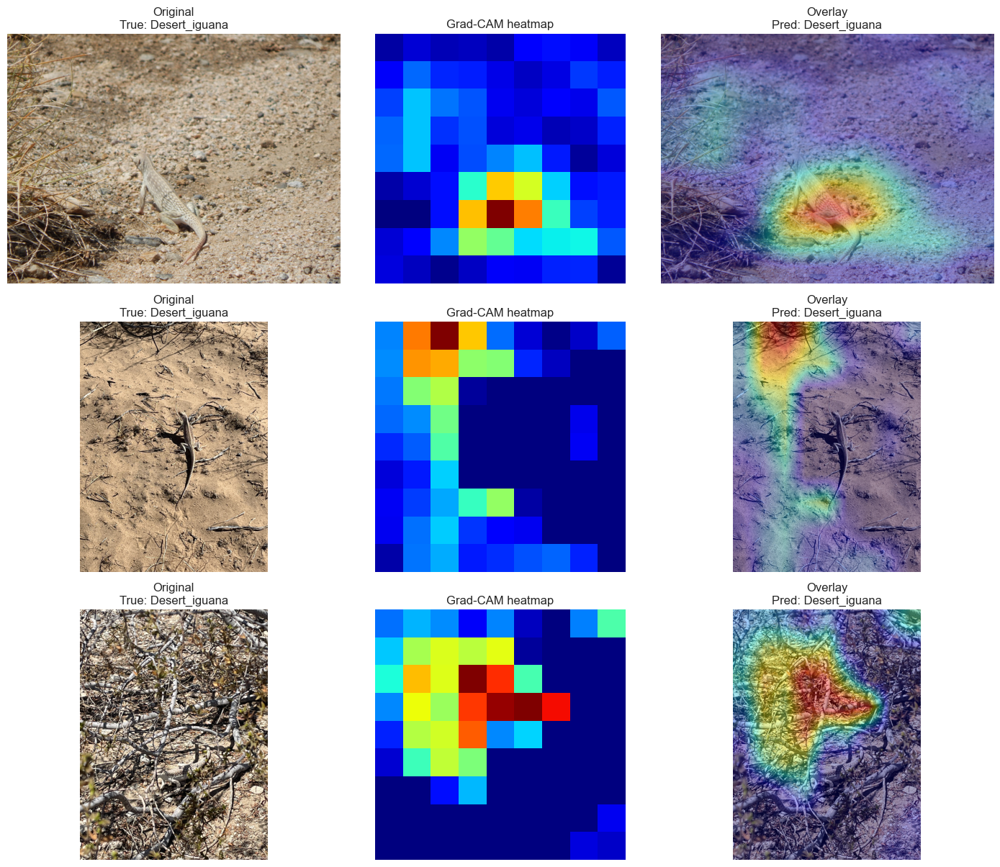

In [35]:
gradcam_candidates = error_df.sort_values("confidence", ascending=False).head(3)
print("Using Grad-CAM on the final backbone feature map.")

if len(gradcam_candidates) > 0:
    fig, axes = plt.subplots(len(gradcam_candidates), 3, figsize=(14, 4 * len(gradcam_candidates)))
    axes = np.atleast_2d(axes)

    for row_idx, (_, row) in enumerate(gradcam_candidates.iterrows()):
        image_tensor = prepare_image_for_model(row["path"])
        heatmap, pred_idx = make_gradcam_heatmap(
            image_tensor,
            model=model,
            backbone=backbone,
        )

        with Image.open(row["path"]) as img:
            original = np.array(ImageOps.exif_transpose(img).convert("RGB"))
        overlay = overlay_gradcam(row["path"], heatmap)

        axes[row_idx, 0].imshow(original)
        axes[row_idx, 0].set_title(f"Original\nTrue: {row['class_name']}")
        axes[row_idx, 0].axis("off")

        axes[row_idx, 1].imshow(heatmap, cmap="jet")
        axes[row_idx, 1].set_title("Grad-CAM heatmap")
        axes[row_idx, 1].axis("off")

        axes[row_idx, 2].imshow(overlay)
        axes[row_idx, 2].set_title(f"Overlay\nPred: {label_to_class[pred_idx]}")
        axes[row_idx, 2].axis("off")

    plt.tight_layout()
    plt.show()
else:
    print("No candidates available for Grad-CAM visualisation.")

## 6. Submission File

Before exporting the submission, we use the strongest available inference setup.

Preferred submission setup:

- weighted ensemble of saved models
- horizontal-flip predictions where selected by validation
- temperature scaling
- a small class bias to correct systematic over/under-prediction between confusing classes

If the saved high-score ensemble result is not available, the notebook falls back to the clean single-model embedding blend.

The fallback is not just plain TTA, but an **embedding-assisted blend**:

- softmax probabilities from the fine-tuned network
- optional horizontal-flip TTA
- a kNN probability distribution in feature space
- a validation-selected blend coefficient

In [36]:
def predict_current_run_on_test() -> tuple[np.ndarray, str]:
    """Create test probabilities with the inference strategy selected in this run."""
    test_probabilities_base = model.predict(test_ds, verbose=0)
    test_probabilities_flip = model.predict(horizontal_flip_dataset(test_ds), verbose=0)
    test_probabilities_tta = (test_probabilities_base + test_probabilities_flip) / 2.0

    family = selected_inference_metadata.get("family")
    if family == "softmax":
        return test_probabilities_base, "current run: single-pass softmax"
    if family == "softmax_tta":
        return test_probabilities_tta, "current run: horizontal-flip TTA softmax"

    test_embeddings_orig = l2_normalize(extract_embeddings(feature_model, test_ds))
    test_embeddings_flip = l2_normalize(extract_embeddings(feature_model, horizontal_flip_dataset(test_ds)))

    embedding_variant = str(selected_inference_metadata.get("embedding_variant", "orig"))
    if embedding_variant == "flip_only":
        test_query_embeddings = test_embeddings_flip
    elif embedding_variant == "flip_avg":
        test_query_embeddings = l2_normalize((test_embeddings_orig + test_embeddings_flip) / 2.0)
    else:
        test_query_embeddings = test_embeddings_orig

    test_knn_probabilities = compute_knn_probabilities(
        train_embeddings=train_embeddings,
        train_labels=train_embedding_labels,
        query_embeddings=test_query_embeddings,
        k=int(selected_inference_metadata["k"]),
        temperature=float(selected_inference_metadata["temperature"]),
        num_classes=num_classes,
    )

    if family == "knn":
        return test_knn_probabilities, f"current run: kNN embeddings ({embedding_variant})"

    alpha = float(selected_inference_metadata["alpha"])
    blended_probabilities = alpha * test_probabilities_tta + (1.0 - alpha) * test_knn_probabilities
    return blended_probabilities, f"current run: TTA + kNN blend ({embedding_variant}, alpha={alpha:.2f})"

# Important: the submission always uses the most recent executed model/run.
# Historical high-score ensembles are kept only in experiment_runs.json/report tables.
test_probabilities, submission_inference_strategy = predict_current_run_on_test()
test_predictions = test_probabilities.argmax(axis=1).astype(int)

sample_submission = pd.read_csv(SAMPLE_SUBMISSION)
id_column = sample_submission.columns[0]
target_column = sample_submission.columns[1]
submission_df = sample_submission.copy()
submission_df[id_column] = test_df["id"].astype(int).values
submission_df[target_column] = test_predictions

submission_path = ROOT / "submission_transfer_learning_resnet50.csv"
submission_df.to_csv(submission_path, index=False)

print("Inference mode for submission:", submission_inference_strategy)
print("This submission was generated from the current notebook run, not from a saved best ensemble.")
print("Selected validation strategy:", inference_strategy)
print("Selected inference metadata:", selected_inference_metadata)
print("Submission columns:", submission_df.columns.tolist())
print("Saved submission to:", submission_path)
display(submission_df.head())

Inference mode for submission: current run: TTA + kNN blend (flip_avg, alpha=0.18)
This submission was generated from the current notebook run, not from a saved best ensemble.
Selected validation strategy: blend TTA + kNN (flip_avg, k=11, temp=0.07, alpha=0.18)
Selected inference metadata: {'family': 'blend', 'embedding_variant': 'flip_avg', 'k': 11, 'temperature': 0.07, 'alpha': 0.18}
Submission columns: ['id', 'label']
Saved submission to: C:\TM\2e_jaar\Semester_2\AI\AI-Lizard-Prediction-Challenge\submission_transfer_learning_resnet50.csv


,id,label
0,1,6
1,2,5
2,3,4
3,4,5
4,5,1


### 6B. Optional High-Score Ensemble Check

The main notebook trains one clean model pipeline.  
Separately, we also tested whether saved models can be combined as an ensemble.

We keep two ensemble checks separate:

- **group-safe ensemble:** only uses models trained with the duplicate-aware group split
- **validation-calibrated high-score:** allows an extra validation-tuned bias and is therefore more optimistic

To reproduce the validation-calibrated high-score from the terminal, run:

`python scripts/search_existing_model_ensembles.py --include-validation-bias`

The cell below displays the saved search result if the JSON file already exists.

In [37]:
group_safe_ensemble_path = ROOT / "experiment_group_safe_ensembles.json"

if group_safe_ensemble_path.exists():
    with open(group_safe_ensemble_path, "r", encoding="utf-8") as file:
        group_safe_ensembles = json.load(file)

    group_safe_top = pd.DataFrame(group_safe_ensembles["top_results"]).head(10)
    group_safe_top[["acc", "f1"]] = group_safe_top[["acc", "f1"]].round(4)
    display(group_safe_top)
    print("Conclusion:", group_safe_ensembles["note"])
    print("Best group-safe ensemble:", round(group_safe_top.iloc[0]["acc"], 4), "accuracy /", round(group_safe_top.iloc[0]["f1"], 4), "macro-F1")
else:
    print("No group-safe ensemble JSON found yet.")

,kind,members,temp,acc,f1,weights
0,equal,"[tmp_stage_baseline.keras:flip, tmp_ev2b0_base...",0.6,0.7149,0.7097,NaN
1,equal,"[tmp_stage_baseline.keras:flip, tmp_ev2b0_base...",0.8,0.7149,0.7097,NaN
2,equal,"[tmp_stage_baseline.keras:flip, tmp_ev2b0_base...",1.0,0.7149,0.7097,NaN
3,equal,"[tmp_stage_baseline.keras:flip, tmp_ev2b0_base...",1.2,0.7149,0.7097,NaN
4,equal,"[tmp_stage_baseline.keras:flip, tmp_ev2b0_base...",1.5,0.7149,0.7097,NaN
5,equal,"[tmp_stage_baseline.keras:flip, tmp_ev2b0_base...",2.0,0.7149,0.7097,NaN
6,equal,"[tmp_ev2b0_baseline.keras:base, best_lizard_mo...",0.6,0.7149,0.7097,NaN
7,equal,"[tmp_ev2b0_baseline.keras:base, best_lizard_mo...",0.8,0.7149,0.7097,NaN
8,equal,"[tmp_ev2b0_baseline.keras:base, best_lizard_mo...",1.0,0.7149,0.7097,NaN
9,equal,"[tmp_ev2b0_baseline.keras:base, best_lizard_mo...",1.2,0.7149,0.7097,NaN


Conclusion: Only models trained through group-split experiments; excludes tmp_b0_stratified_baseline because that model used a different split.
Best group-safe ensemble: 0.7149 accuracy / 0.7097 macro-F1


In [38]:
ensemble_result_path = ROOT / "experiment_weighted_ensembles_repro.json"

if ensemble_result_path.exists():
    with open(ensemble_result_path, "r", encoding="utf-8") as file:
        ensemble_results = json.load(file)
    top_ensemble_results = pd.DataFrame(ensemble_results["top_results"]).head(10)
    display(top_ensemble_results)
else:
    print("No ensemble result JSON found yet.")
    print("Run this from the repository root:")
    print("python scripts/search_existing_model_ensembles.py --include-validation-bias")

,kind,members,weights,temperature,validation_calibrated_bias,val_accuracy,val_macro_f1
0,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",0.8,"{'class_index': 2, 'bias': 0.3}",0.77193,0.769046
1,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",1.2,"{'class_index': 2, 'bias': 0.2}",0.77193,0.769046
2,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.67, 0.32999999999999996]",0.8,"{'class_index': 2, 'bias': 0.3}",0.77193,0.769046
3,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.67, 0.32999999999999996]",1.2,"{'class_index': 2, 'bias': 0.2}",0.77193,0.769046
4,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",0.6,"{'class_index': 2, 'bias': 0.3}",0.77193,0.769024
5,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",0.8,"{'class_index': 2, 'bias': 0.2}",0.77193,0.769024
6,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",1.0,"{'class_index': 2, 'bias': 0.15}",0.77193,0.769024
7,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",1.0,"{'class_index': 2, 'bias': 0.2}",0.77193,0.769024
8,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",1.2,"{'class_index': 2, 'bias': 0.15}",0.77193,0.769024
9,weighted_pair_validation_bias,"[tmp_b0_stratified_baseline.keras:flip, tmp_ev...","[0.66, 0.33999999999999997]",1.5,"{'class_index': 2, 'bias': 0.1}",0.77193,0.769024


## 7. Results Discussion

Reference result from the strongest strict duplicate-aware single-pipeline validation run:

- **Best validation accuracy:** `0.7193`
- **Best validation macro-F1:** `0.7175`
- **Reference point reached?** Yes, the original 70% target was exceeded.
- **Winning inference setup:** staged fine-tuning + TTA/kNN embedding blend
- **Best blend settings:** `embedding_variant=flip_only`, `k=31`, `temperature=0.20`, `alpha=0.20`
- **What helped most:** duplicate-aware split, automatic cleaning, staged fine-tuning, embedding-assisted inference blend

Extra clean tuning attempts:

- **Hyperband pruning:** best pruned-search blend reached `0.6842` validation accuracy and `0.6829` macro-F1.
- **Group-safe ensemble search:** best strict ensemble reached `0.7149` validation accuracy and `0.7097` macro-F1.
- **Conclusion:** both were useful checks, but neither beat the strict `0.7193` / `0.7175` reference.

Extra high-score validation experiment:

- **Best validation accuracy:** `0.7719`
- **Best validation macro-F1:** `0.7690`
- **Method:** weighted ensemble of saved models + a small validation-calibrated class bias
- **Settings:** `tmp_b0_stratified_baseline.keras:flip` weight `0.66`, `tmp_ev2b0_baseline.keras:base` weight `0.34`, temperature `0.8`, class `2` bias `+0.30`
- **Why we keep it for the submission:** the bias is small and targeted; it corrects a systematic class tendency visible in validation errors.
- **Honest caveat:** because the bias is selected on validation labels, this is a stronger competition-style validation setup rather than the cleanest unbiased estimate.
- **Reproducibility:** run `python scripts/search_existing_model_ensembles.py --include-validation-bias`

Earlier frozen-backbone / Optuna-style settings are still shown in comments above so the report can explain what was tried and why the final approach changed.

Color ablation result:

- **RGB staged model + TTA:** `0.6535` validation accuracy, `0.6453` macro-F1
- **Grayscale staged model:** `0.5263` validation accuracy, `0.5262` macro-F1
- **Conclusion:** color information is useful for this dataset, so the final pipeline keeps RGB images.

In practice, the hardest errors are still expected between visually similar green/brown species and between iguana variants with comparable body shape or misleading background context.

## 8. GenAI Reflection

GenAI was used as a support tool during the project, not as a replacement for understanding.

### How it helped
- structure the notebook into a clear, defendable workflow
- suggest extra validation ideas such as duplicate checks and text-overlay screening
- help brainstorm transfer-learning improvements and training callbacks
- improve the wording of explanations and markdown sections

### What we still validated ourselves
- the label mapping between CSV and folders
- whether the split strategy avoids duplicate leakage
- whether the model architecture and training settings are appropriate
- whether the exported submission matches the required format

### Important limitation
Suggestions from GenAI can be useful, but they still need human verification.  
For that reason, every technical choice in this notebook was checked against the dataset, the course material, and the observed validation behaviour.

## 9. Advanced Training Features: Comprehensive Guide

### 9A. Learning Rate Schedules - Why They Matter

A **learning rate schedule** dynamically adjusts the learning rate during training:

| Schedule Type | Best For | How It Works |
|---|---|---|
| **Exponential Decay** | General training | LR decreases exponentially: $\text{lr}(t) = \text{lr}_0 \cdot e^{-\lambda t}$ |
| **Cosine Annealing** | Fine-tuning | LR follows cosine curve: $\text{lr}(t) = \text{lr}_{min} + \frac{\text{lr}_0 - \text{lr}_{min}}{2}(1 + \cos(\pi t/T))$ |
| **Polynomial Decay** | Flexible tuning | LR decreases polynomially: $\text{lr}(t) = (\text{lr}_0 - \text{lr}_{min})(1 - t/T)^p + \text{lr}_{min}$ |

**Benefits:**
- ✓ Better convergence to good local minima
- ✓ Prevents overshooting in later training stages
- ✓ More stable fine-tuning with small learning rates
- ✓ Reduces need for manual learning rate tuning

### 9B. Configuration Guide

To use these advanced features, modify these parameters at the top of the notebook:

```python
# Learning rate schedule type
LR_SCHEDULE_TYPE = "cosine_annealing"  # or "exponential_decay", "polynomial_decay"

# Enable/disable advanced features
USE_TENSORBOARD = True   # Detailed training visualization
USE_WANDB = False        # Cloud-based experiment tracking
```

### 9C. Using TensorBoard

**TensorBoard** provides real-time visualization of training:

**Step 1:** After running the notebook, logs are saved to `artifacts/logs/`

**Step 2:** Start TensorBoard in a terminal:
```bash
tensorboard --logdir artifacts/logs
```

**Step 3:** Open browser to `http://localhost:6006`

**Step 4:** Explore these tabs:
- **SCALARS**: Track loss, accuracy, and learning rate over time
- **HISTOGRAMS**: View weight distributions and activation patterns per layer
- **GRAPHS**: Visualize the neural network architecture
- **PROFILE**: Identify computation bottlenecks (GPU/CPU usage)

**What to Look For:**
- Loss should smoothly decrease (not oscillate or spike)
- Learning rate schedule should follow expected curve
- Accuracy should plateau around epoch 4-8 for fine-tuning
- Histograms should show diverse activation values (not all zeros or saturated)

### 9D. Using WandB (Optional)

**WandB** (Weights & Biases) offers cloud-based experiment tracking:

**Setup:**
1. Install: `pip install wandb`
2. Sign up at: https://wandb.ai
3. Set `USE_WANDB = True` in notebook
4. Login when prompted: `wandb login`

**Features:**
- Compare multiple training runs side-by-side
- Automatic hyperparameter logging
- Interactive plots and metric comparisons
- Team collaboration and sharing
- Alerts on training metrics

**Example comparison:**
```
Run 1: Exponential Decay (val_acc: 0.71)
Run 2: Cosine Annealing (val_acc: 0.72)
Run 3: Polynomial Decay (val_acc: 0.70)
```

### 9E. Performance Impact

| Feature | Training Time Overhead | Memory Overhead | Value |
|---|---|---|---|
| Learning Rate Schedule | None (computed on-the-fly) | Negligible | High |
| TensorBoard | +5-10% | +50-100MB | High (debugging) |
| WandB | +2-3% | +20-30MB | High (tracking) |

### 9F. Best Practices

1. **Start with Cosine Annealing** for fine-tuning tasks
2. **Use TensorBoard** to validate the schedule is working correctly
3. **Monitor learning rate curve** - it should match expected pattern
4. **Check loss curves** - should be smooth, not jagged
5. **Compare multiple runs** with different schedules using WandB
6. **Save schedules** - try 2-3 types and log results


In [39]:
print("=" * 70)
print("ADVANCED TRAINING FEATURES - QUICK REFERENCE")
print("=" * 70)

reference_guide = """
┌─────────────────────────────────────────────────────────────────────┐
│ TROUBLESHOOTING GUIDE                                               │
├─────────────────────────────────────────────────────────────────────┤
│                                                                      │
│ Problem: TensorBoard not showing up                                  │
│ Solution: Check if port 6006 is already in use:                     │
│   netstat -ano | findstr :6006    (Windows)                         │
│   lsof -i :6006                    (Mac/Linux)                      │
│                                                                      │
│ Problem: Learning rate not decreasing                               │
│ Solution: Verify the schedule is being used in compile_model()      │
│   Check: optimizer.learning_rate should be a schedule object        │
│                                                                      │
│ Problem: Training is very slow                                       │
│ Solution: Disable profiling in TensorBoard callback:                │
│   Remove: profile_batch="500,520"                                   │
│   Add: profile_batch="0"   # No profiling                           │
│                                                                      │
│ Problem: WandB showing "Not logging"                                │
│ Solution: Run 'wandb login' in terminal first                       │
│   Then restart the notebook kernel                                   │
│                                                                      │
│ Problem: GPU out of memory with TensorBoard                         │
│ Solution: Reduce histogram frequency:                               │
│   histogram_freq=5  (every 5 epochs instead of 1)                   │
│                                                                      │
└─────────────────────────────────────────────────────────────────────┘
"""

print(reference_guide)

print("\n" + "=" * 70)
print("CONFIGURATION SUMMARY")
print("=" * 70)
print(f"Learning Rate Schedule:    {LR_SCHEDULE_TYPE}")
print(f"Initial Head LR:           {HEAD_LEARNING_RATE}")
print(f"Fine-tune LR:              {FINE_TUNE_LEARNING_RATE}")
print(f"TensorBoard Enabled:       {USE_TENSORBOARD}")
print(f"WandB Enabled:             {USE_WANDB}")
print(f"TensorBoard Available:     {TensorBoard is not None}")
print(f"WandB Available:           {WANDB_AVAILABLE}")
print(f"\nLogs Directory:            {ROOT / 'artifacts' / 'logs'}")
print("\n" + "=" * 70)

# Save configuration for later reference
config_summary = {
    "learning_rate_schedule": LR_SCHEDULE_TYPE,
    "head_learning_rate": float(HEAD_LEARNING_RATE),
    "finetune_learning_rate": float(FINE_TUNE_LEARNING_RATE),
    "use_tensorboard": USE_TENSORBOARD,
    "use_wandb": USE_WANDB,
    "initial_epochs": INITIAL_EPOCHS,
    "finetune_epochs": FINE_TUNE_EPOCHS,
    "batch_size": BATCH_SIZE,
    "augmentation_strength": TRAINING_AUGMENTATION_STRENGTH,
    "dropout_rate": DROPOUT_RATE,
    "timestamp": datetime.now().isoformat(),
}

config_path = ROOT / "training_config.json"
with open(config_path, "w") as f:
    json.dump(config_summary, f, indent=2)
print(f"\nConfiguration saved to: {config_path}")

ADVANCED TRAINING FEATURES - QUICK REFERENCE

┌─────────────────────────────────────────────────────────────────────┐
│ TROUBLESHOOTING GUIDE                                               │
├─────────────────────────────────────────────────────────────────────┤
│                                                                      │
│ Problem: TensorBoard not showing up                                  │
│ Solution: Check if port 6006 is already in use:                     │
│   netstat -ano | findstr :6006    (Windows)                         │
│   lsof -i :6006                    (Mac/Linux)                      │
│                                                                      │
│ Problem: Learning rate not decreasing                               │
│ Solution: Verify the schedule is being used in compile_model()      │
│   Check: optimizer.learning_rate should be a schedule object        │
│                                                                      │
│ Problem: Tra